<a href="https://colab.research.google.com/github/kimchobab/trade-co-movement-analysis/blob/main/trade_movement.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[주제]
무역 품목 간 공행성 쌍 판별 및 후행 품목 무역량 예측 AI 모델 개발

[설명]
원시 무역 수입 데이터(2022년 1월 ~ 2025년 7월)를 기반으로, 품목 간 공행성(comovement)이 존재하는 선후행 쌍을 예측하고, 공행성이 있다고 판단된 경우에는 후행 품목의 다음 달(2025년 8월) 총 무역량(value)을 예측하는 AI 모델을 개발합니다.

참가자는 주어진 원시 무역 데이터를 분석하여 품목 간 선후행 관계가 존재하는 공행성 쌍(A → B)을 찾아야 하며, 이후에는 선행 품목(A)의 흐름을 활용해 후행 품목(B)의 다음달의 총 무역량(value)을 예측해야 합니다.

1. import packages

In [171]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from tqdm import tqdm # 반복문 진행율 표시

import warnings
warnings.filterwarnings(action='ignore')

2. data loading

In [94]:
data = pd.read_csv('train.csv')
print(data.shape)
data.head(5)

(10836, 9)


,item_id,year,month,seq,type,hs4,weight,quantity,value
0,DEWLVASR,2022,1,1.0,1,3038,14858.0,0.0,32688.0
1,ELQGMQWE,2022,1,1.0,1,2002,62195.0,0.0,110617.0
2,AHMDUILJ,2022,1,1.0,1,2102,18426.0,0.0,72766.0
3,XIPPENFQ,2022,1,1.0,1,2501,20426.0,0.0,11172.0
4,FTSVTTSR,2022,1,1.0,1,2529,248000.0,0.0,143004.0


In [95]:
submission = pd.read_csv('sample_submission.csv')
print(submission.shape)
submission.head(5)

(9900, 3)


,leading_item_id,following_item_id,value
0,DEWLVASR,ELQGMQWE,999999999
1,DEWLVASR,AHMDUILJ,999999999
2,DEWLVASR,XIPPENFQ,999999999
3,DEWLVASR,FTSVTTSR,999999999
4,DEWLVASR,XMKRPGLB,999999999


3. preprocessiong(전처리)

In [96]:
print(data.shape)
print(data.dtypes)
data.info()
data.isnull().sum()

(10836, 9)
item_id      object
year          int64
month         int64
seq         float64
type          int64
hs4           int64
weight      float64
quantity    float64
value       float64
dtype: object
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10836 entries, 0 to 10835
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   item_id   10836 non-null  object 
 1   year      10836 non-null  int64  
 2   month     10836 non-null  int64  
 3   seq       10836 non-null  float64
 4   type      10836 non-null  int64  
 5   hs4       10836 non-null  int64  
 6   weight    10836 non-null  float64
 7   quantity  10836 non-null  float64
 8   value     10836 non-null  float64
dtypes: float64(4), int64(4), object(1)
memory usage: 762.0+ KB


,0
item_id,0
year,0
month,0
seq,0
type,0
hs4,0
weight,0
quantity,0
value,0


In [97]:
# 기초통계량
data.describe().T

,count,mean,std,min,25%,50%,75%,max
year,10836.0,2.023331e+03,1.049357e+00,2022.0,2022.00,2023.0,2024.00,2025.0
month,10836.0,6.108435e+00,3.392649e+00,1.0,3.00,6.0,9.00,12.0
seq,10836.0,2.034238e+00,8.133801e-01,1.0,1.00,2.0,3.00,3.0
type,10836.0,1.000000e+00,0.000000e+00,1.0,1.00,1.0,1.00,1.0
hs4,10836.0,4.821970e+03,2.296893e+03,1210.0,2833.00,3824.0,7202.00,9403.0
weight,10836.0,1.098413e+06,5.153790e+06,0.0,345.75,6532.5,155510.75,110491899.0
quantity,10836.0,8.633771e+04,7.614669e+06,0.0,0.00,0.0,0.00,792598955.0
value,10836.0,1.739442e+06,5.457480e+06,0.0,11506.75,125007.0,1039763.50,111041383.0


In [98]:
data.describe(include='object')

,item_id
count,10836
unique,100
top,ELQGMQWE
freq,129


In [99]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10836 entries, 0 to 10835
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   item_id   10836 non-null  object 
 1   year      10836 non-null  int64  
 2   month     10836 non-null  int64  
 3   seq       10836 non-null  float64
 4   type      10836 non-null  int64  
 5   hs4       10836 non-null  int64  
 6   weight    10836 non-null  float64
 7   quantity  10836 non-null  float64
 8   value     10836 non-null  float64
dtypes: float64(4), int64(4), object(1)
memory usage: 762.0+ KB


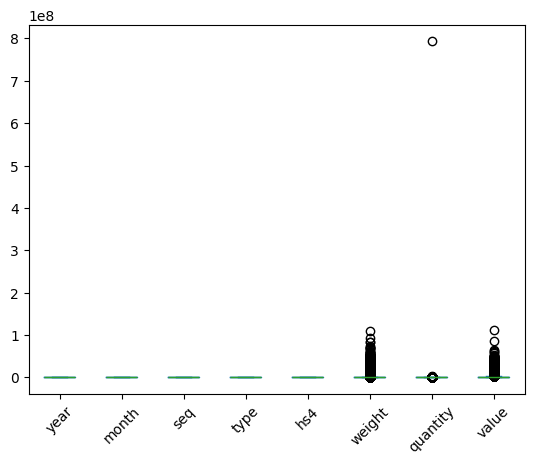

In [100]:
# 결측치, 이상치
data.plot(kind='box')
plt.xticks(rotation=45)
plt.show()

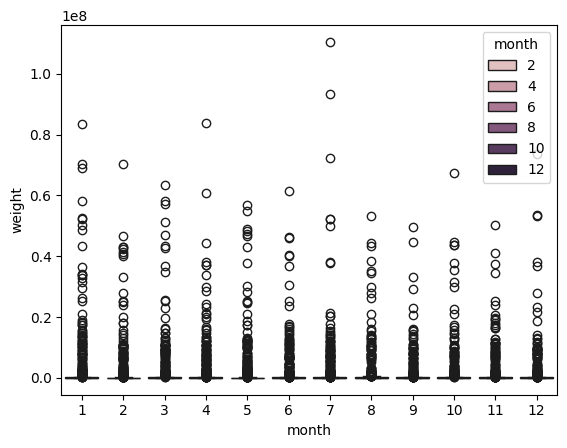

In [101]:
sns.boxplot(data=data,
            x='month',
            y='weight',
            hue= 'month')
plt.show()

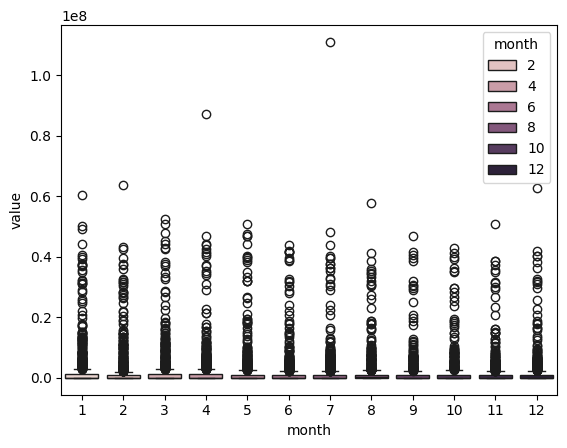

In [102]:
sns.boxplot(data=data, x='month',
            y='value',
            hue='month')
plt.show()

4.변수분포간 시각화

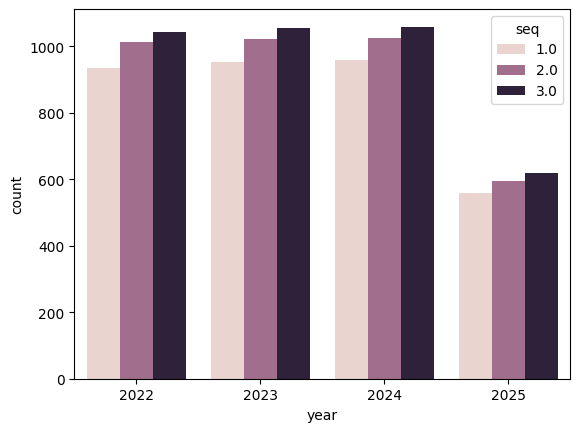

In [103]:
sns.countplot(data=data, x='year', hue='seq')
plt.show()

#연도 및 seq별 데이터 개수를 확인한 결과, 2022~2024년은 비교적 균형적인 관측치를 보였으나 2025년은 상대적으로 적은 관측치를 보였다. 이는 해당 연도의 데이터가 일부만 포함되었기 때문으로 판단된다.

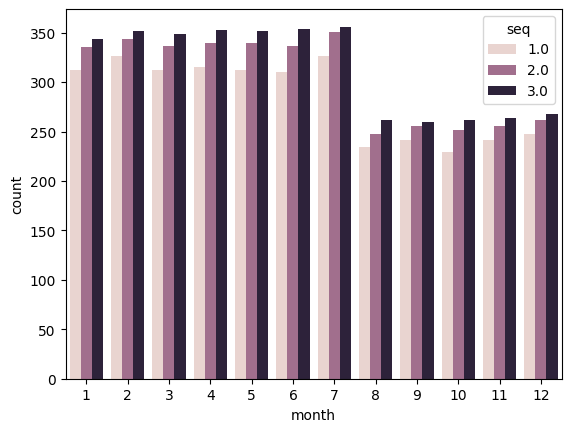

In [104]:
sns.countplot(data=data, x='month', hue='seq')
plt.show()

#월별 관측치 분포를 확인한 결과, 1~7월은 비교적 일정한 관측치를 보였으나 8~12월은 상대적으로 적은 관측치를 보였다. 이는 일부 연도의 데이터가 상반기까지만 포함되었기 때문으로 판단된다.

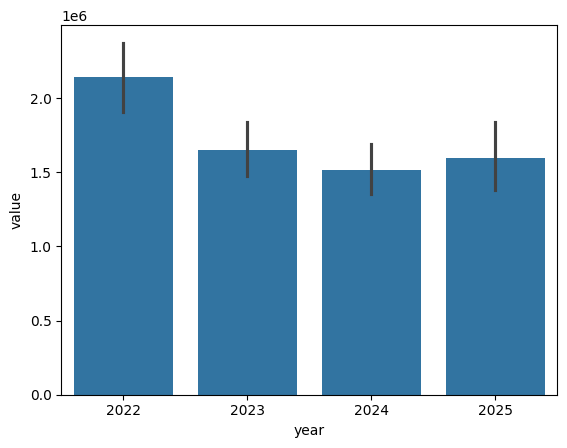

In [105]:
sns.barplot(data=data, x='year',y='value')
plt.show()
# 연도별 평균 수출금액을 비교한 결과 2022년이 가장 높았으며 이후 감소하는 경향을 보였다. 다만 이는 평균 기준 분석으로, 일부 극단값의 영향 가능성이 존재한다.

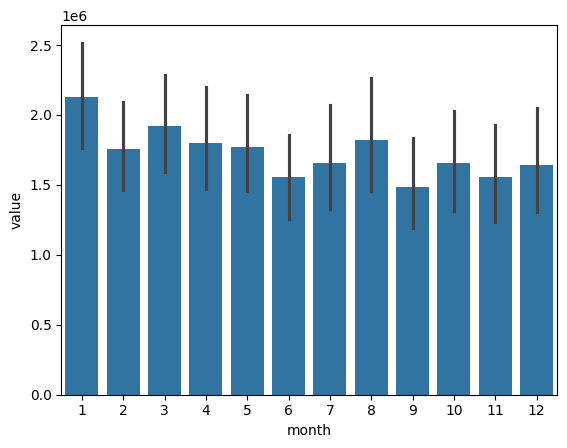

In [106]:
sns.barplot(data=data, x='month',y='value')
plt.show()

#월별 평균 수출금액을 비교한 결과 일부 월에서 상대적으로 높은 값을 보였으나, 신뢰구간이 상당 부분 겹쳐 통계적으로 뚜렷한 계절성이 있다고 단정하기는 어렵다.

5.변수간 관계 시각화

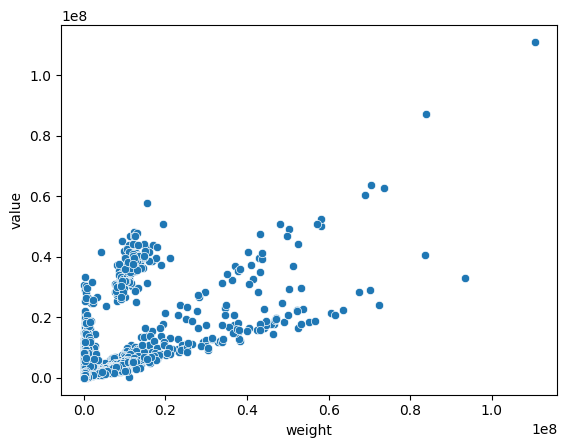

In [107]:
# weight,value 간의 관계
sns.scatterplot(data=data, x='weight', y='value')
plt.show()

#weight와 value 간 산점도를 확인한 결과, 두 변수 간에는 뚜렷한 양의 상관관계가 관찰되었다. 다만 일부 극단값과 비선형 구조가 존재하여 단순 선형 관계로 해석하기에는 한계가 있다. 이에 따라 value를 주요 분석 변수로 선택하고 로그 변환을 적용하였다.

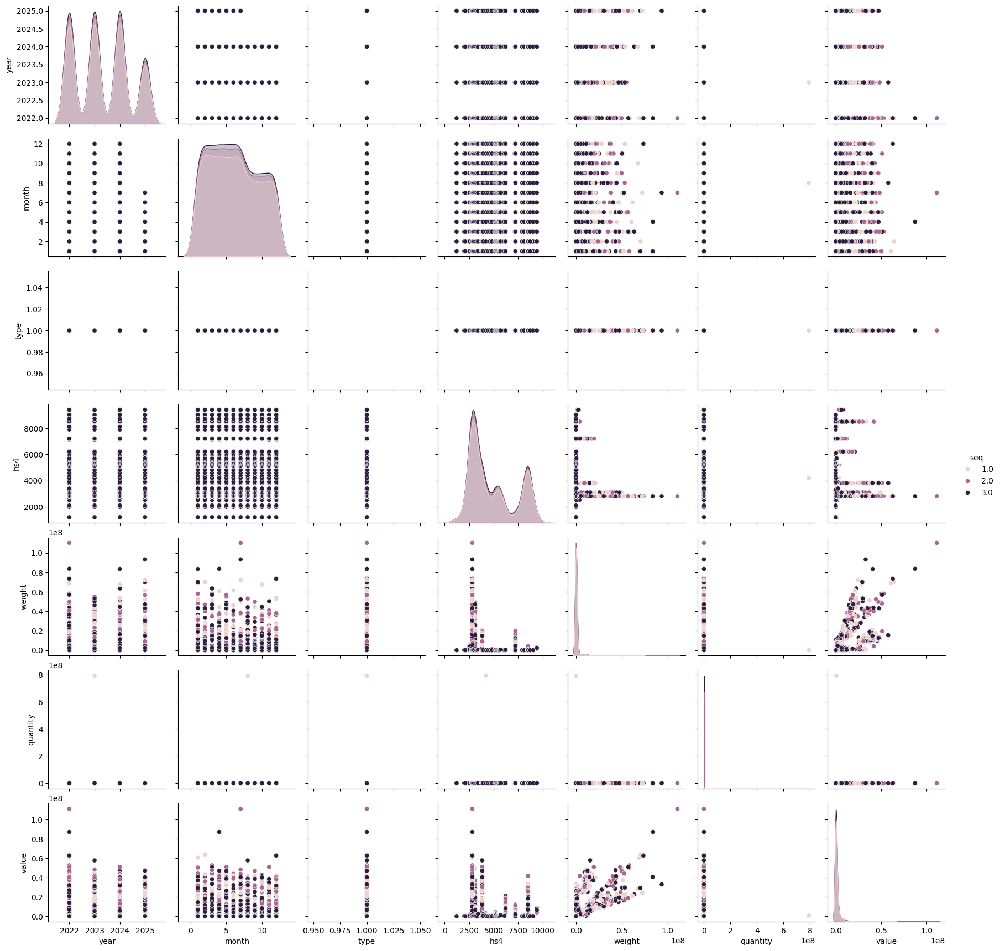

In [108]:
sns.pairplot(data=data,hue='seq')
plt.show()

#개별 변수 분석 이후 전체 변수 간 관계를 종합적으로 확인하기 위해 pairplot을 활용하였다. 이를 통해 value와 weight·quantity 간 강한 양의 관계를 재확인하였으며, seq 변수에 따른 뚜렷한 구분은 나타나지 않았다.

5. analysis :
a.데이터 전처리
b.변수분석
c.상관관계 및 feature engineering

In [109]:
print(f'data.shape = {data.shape}')
display(data.apply(lambda x: len(np.unique(x)),axis=0))
display(data.apply(lambda x: np.unique(x),axis=0))

#데이터는 총 10,836개의 관측치와 9개의 변수로 구성되어 있으며, 100개 품목과 4개 연도, 12개월 구조를 가진 패널 데이터임을 확인하였다. type 변수는 단일 값만을 가지므로 분석에서 제외하였다.

data.shape = (10836, 9)


,0
item_id,100
year,4
month,12
seq,3
type,1
hs4,71
weight,7438
quantity,1226
value,9686


,0
item_id,"[AANGBULD, AHMDUILJ, ANWUJOKX, APQGTRMF, ATLDM..."
year,"[2022, 2023, 2024, 2025]"
month,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]"
seq,"[1.0, 2.0, 3.0]"
type,[1]
hs4,"[1210, 2002, 2102, 2501, 2529, 2612, 2701, 271..."
weight,"[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ..."
quantity,"[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ..."
value,"[0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, ..."


In [110]:
# item-id와 hs4 대응관계
data['hs4'].value_counts()

# HS4 기준 품목 분포를 확인한 결과, 일부 품목에 관측치가 집중되어 있으며 일부 품목은 매우 적은 관측치를 보였다. 이에 따라 분석의 안정성을 확보하기 위해 상위 빈도 품목 중심으로 분석을 진행하였다.

,count
hs4,
2805,646
3824,535
2811,516
8501,423
8505,387
...,...
4302,9
7142,8
2612,6


In [111]:
display(data.groupby(['item_id','year','month'], as_index=False)['value'].size().sort_values(by='size',ascending=False))
# 한달안에 같은 물건이 여러번 팔릴수 있다라는 말(3번까지 -> seq컬럼의 1,2,3으로 그 달에 팔린 횟수를 알수 있음)

data[(data['item_id']=='ZXERAXWP')&(data['year']==2024)&(data['month']==3)]

# 동일 품목이 동일 연·월에 복수 거래로 기록되어 있음을 확인하였다. 이에 따라 공행성 분석을 위해 거래 단위 데이터를 월별 총합 시계열로 집계하였다.

,item_id,year,month,size
3759,ZXERAXWP,2024,3,3
3758,ZXERAXWP,2024,2,3
3757,ZXERAXWP,2024,1,3
3756,ZXERAXWP,2023,12,3
3755,ZXERAXWP,2023,11,3
...,...,...,...,...
294,BLANHGYY,2022,2,1
303,BLANHGYY,2023,3,1
101,APQGTRMF,2023,10,1
106,APQGTRMF,2024,3,1


,item_id,year,month,seq,type,hs4,weight,quantity,value
6572,ZXERAXWP,2024,3,1.0,1,4802,281.0,0.0,5579.0
6654,ZXERAXWP,2024,3,2.0,1,4802,11.0,0.0,742.0
6739,ZXERAXWP,2024,3,3.0,1,4802,17.0,0.0,1179.0


In [112]:
data.groupby(['hs4'], as_index=False)['item_id'].apply(lambda x: len(np.unique(x))).sort_values(by='item_id',
                                                            ascending=False).reset_index(drop=True)['item_id']
# HS4와 item_id 간 관계를 확인한 결과, 하나의 HS4 코드에 복수의 item_id가 포함되어 있음을 확인하였다. 이에 따라 분석 목적에 따라 집계 단위를 구분하여 설정하였다.

,item_id
0,6
1,5
2,5
3,4
4,3
...,...
66,1
67,1
68,1
69,1


In [113]:
data.groupby(['hs4'], as_index=False)['item_id'].apply(lambda x: np.unique(x))
# HS4 코드별 item_id 구성을 확인한 결과, 일부 HS4는 복수의 item_id를 포함하고 있음을 확인하였다. 이에 따라 분석 목적에 따라 집계 단위를 신중히 설정하였다.

,hs4,item_id
0,1210,[JBVHSUWY]
1,2002,[ELQGMQWE]
2,2102,[AHMDUILJ]
3,2501,[XIPPENFQ]
4,2529,"[FTSVTTSR, XMKRPGLB]"
...,...,...
66,8527,[VMAQSTJE]
67,8708,[XIFHSOWQ]
68,8714,"[FITUEHWN, UGEQLMXM]"
69,9022,[BLANHGYY]


In [114]:
tmp_df=data.groupby(['hs4'], as_index=False)['item_id'].apply(lambda x: np.unique(x))
tmp_df['item_id_len'] = data.groupby(['hs4'], as_index=False)['item_id'].apply(lambda x: len(np.unique(x)))['item_id']
hs4_tmp_df = tmp_df.sort_values(by='item_id_len',ascending=False).reset_index(drop=True)

display(hs4_tmp_df.head(20))
print(hs4_tmp_df['hs4'][:20].values)
hs4_tmp_df['item_id_len'][:20].sum()

#HS4 코드별 item 구성을 분석한 결과, 상위 HS4 코드가 다수의 item을 포함하고 있음을 확인하였다. 이에 따라 산업군 단위 분석의 타당성을 확보하였다.

,hs4,item_id,item_id_len
0,2805,"[BSRMSVTC, DJBLNPNC, RCBZUSIM, SUOYXCHP, WQMVC...",6
1,3824,"[FCYBOAXC, IGDVVKUD, LPHPPJUG, PYZMVUWD, SNHYO...",5
2,8501,"[GKQIJYDH, KFQSHBNH, QKXNTIIB, RJCAXSGH, UQYUI...",5
3,2811,"[DNMPSKTB, RJGPVEXX, VWMBASNE, WPQXWHYO]",4
4,8102,"[FQCLOEXA, KEUWZRKO, UIFPPCLR]",3
5,8505,"[GYHKIVQT, ROACSLMG, VBYCLTYZ]",3
6,3815,"[OJIFIHMZ, STZDBITS, XIIEJNEE]",3
7,2807,"[DDEXPPXU, LLHREMKS, YSYHGLQK]",3
8,7207,"[SDWAYPIK, TGOELCAG]",2
9,2846,"[FRHNWLNI, MBSBZBXA]",2


[2805 3824 8501 2811 8102 8505 3815 2807 7207 2846 3102 2529 8714 1210
 2002 2701 2612 2501 2102 2836]


np.int64(49)

In [115]:
# 2805	[BSRMSVTC, DJBLNPNC, RCBZUSIM, SUOYXCHP, WQMVC...	6
dct_hs4_tmp_df = hs4_tmp_df[['hs4','item_id']].set_index('hs4').to_dict()['item_id']
list(dct_hs4_tmp_df[2805]) # hs4 코드 = 2805 의 경우에 포함된 상품들

#상위 HS4 코드 중 item 수가 가장 많은 2805를 대표 산업군으로 선정하였으며, 해당 코드에 속한 6개 item을 확인하였다. 이후 월별 합계 시계열을 생성하여 공행성 분석을 수행하였다.

['BSRMSVTC', 'DJBLNPNC', 'RCBZUSIM', 'SUOYXCHP', 'WQMVCOEM', 'ZKENOUDA']

In [116]:
# monthly data 탐색
# 한 상품에 대해 한달에 3번까지 팔릴수 있는데 그달에 팔린 모든 상품수를 합한 값

# year, monthm item_id 기준으로 value 합산(seq만 다르다면 value 합산)
monthly = (
    data.groupby(['item_id','year','month'], as_index=False)['value'].sum()
)

# year, month를 하나의 키(ym)로 묶기
monthly['ym'] = pd.to_datetime(monthly['year'].astype(str)+"-"+monthly['month'].astype(str).str.zfill(2))

monthly.head()

#동일 연·월에 복수 거래가 존재하므로 거래 단위 데이터를 월별 합계 시계열로 집계하였다. 이후 연·월 정보를 datetime 형식으로 변환하여 시계열 분석을 위한 데이터 구조를 구축하였다.

,item_id,year,month,value,ym
0,AANGBULD,2022,1,14276.0,2022-01-01
1,AANGBULD,2022,2,52347.0,2022-02-01
2,AANGBULD,2022,3,53549.0,2022-03-01
3,AANGBULD,2022,5,26997.0,2022-05-01
4,AANGBULD,2022,6,84489.0,2022-06-01


In [117]:
pivot=(
    monthly.pivot(index='item_id',columns='ym',values='value').fillna(0.0)
    )
pivot.head()

# 월별 집계된 데이터를 item_id별 시계열 형태로 재구성하기 위해 pivot을 적용하였다. 이를 통해 각 품목의 월별 수출금액 시계열을 행렬 형태로 구성하였다.

ym,2022-01-01,2022-02-01,2022-03-01,2022-04-01,2022-05-01,2022-06-01,2022-07-01,2022-08-01,2022-09-01,2022-10-01,...,2024-10-01,2024-11-01,2024-12-01,2025-01-01,2025-02-01,2025-03-01,2025-04-01,2025-05-01,2025-06-01,2025-07-01
item_id,,,,,,,,,,,,,,,,,,,,,
AANGBULD,14276.0,52347.0,53549.0,0.0,26997.0,84489.0,0.0,0.0,0.0,0.0,...,428725.0,144248.0,26507.0,25691.0,25805.0,0.0,38441.0,0.0,441275.0,533478.0
AHMDUILJ,242705.0,120847.0,197317.0,126142.0,71730.0,149138.0,186617.0,169995.0,140547.0,89292.0,...,123085.0,143451.0,78649.0,125098.0,80404.0,157401.0,115509.0,127473.0,89479.0,101317.0
ANWUJOKX,0.0,0.0,0.0,63580.0,81670.0,26424.0,8470.0,0.0,0.0,80475.0,...,0.0,0.0,0.0,27980.0,0.0,0.0,0.0,0.0,0.0,0.0
APQGTRMF,383999.0,512813.0,217064.0,470398.0,539873.0,582317.0,759980.0,216019.0,537693.0,205326.0,...,683581.0,2147.0,0.0,25013.0,77.0,20741.0,2403.0,3543.0,32430.0,40608.0
ATLDMDBO,143097177.0,103568323.0,118403737.0,121873741.0,115024617.0,65716075.0,146216818.0,97552978.0,72341427.0,87454167.0,...,60276050.0,30160198.0,42613728.0,64451013.0,38667429.0,29354408.0,42450439.0,37136720.0,32181798.0,57090235.0


i=1, item name: AANGBULD
i=2, item name: AHMDUILJ
i=3, item name: ANWUJOKX
i=4, item name: APQGTRMF
i=5, item name: ATLDMDBO
i=6, item name: AXULOHBQ


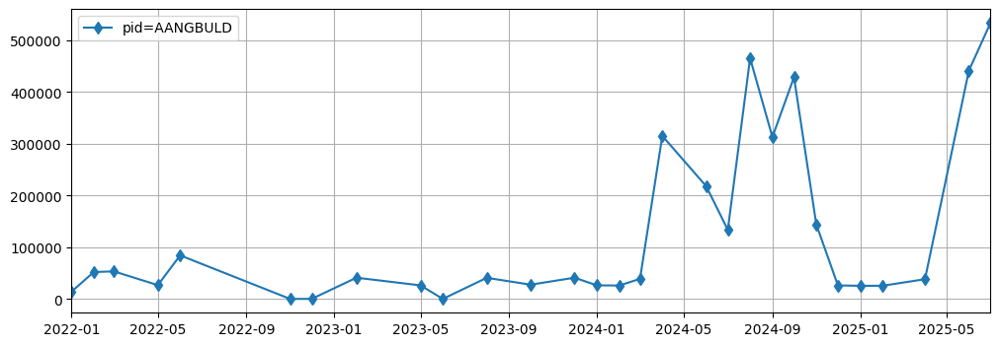

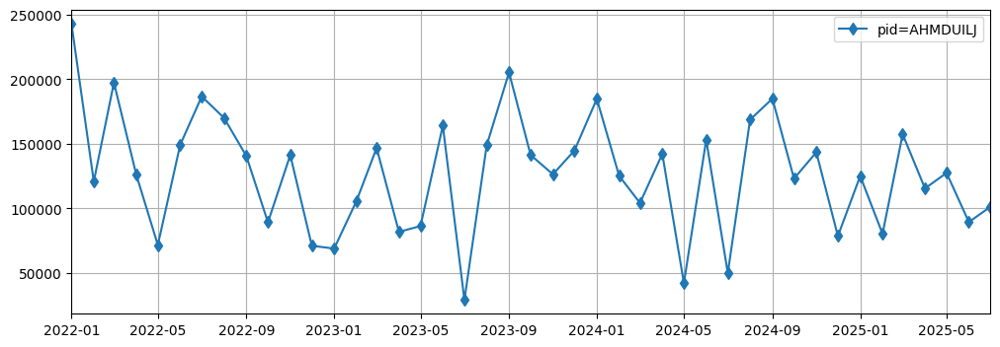

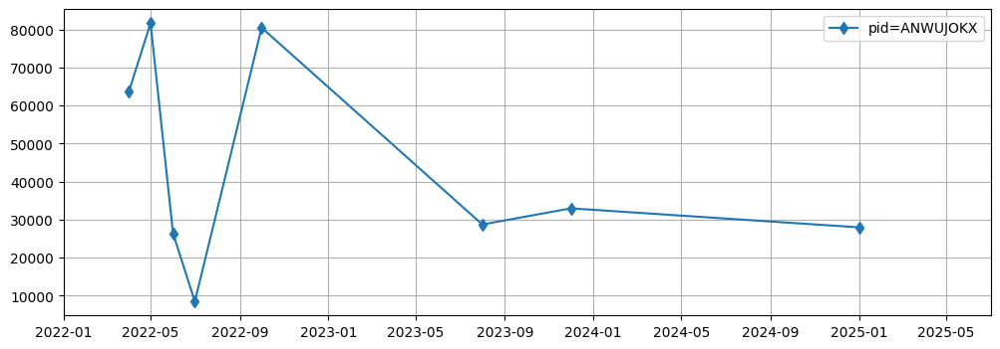

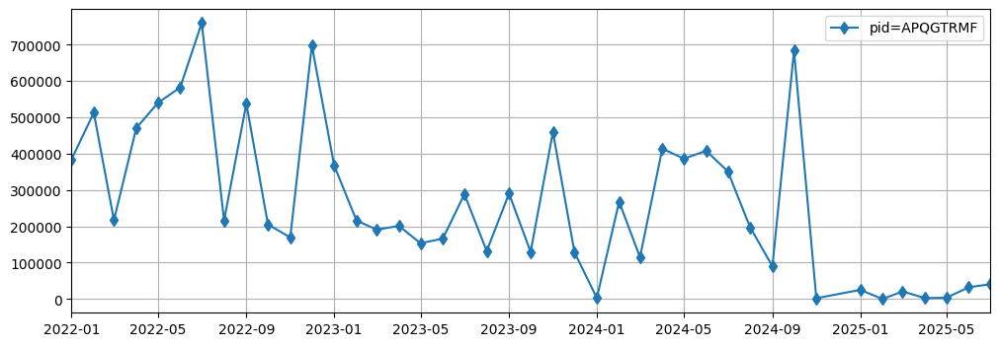

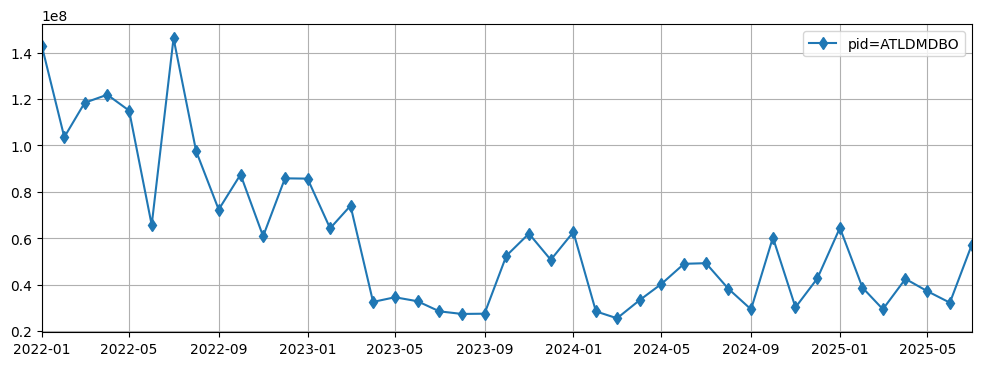

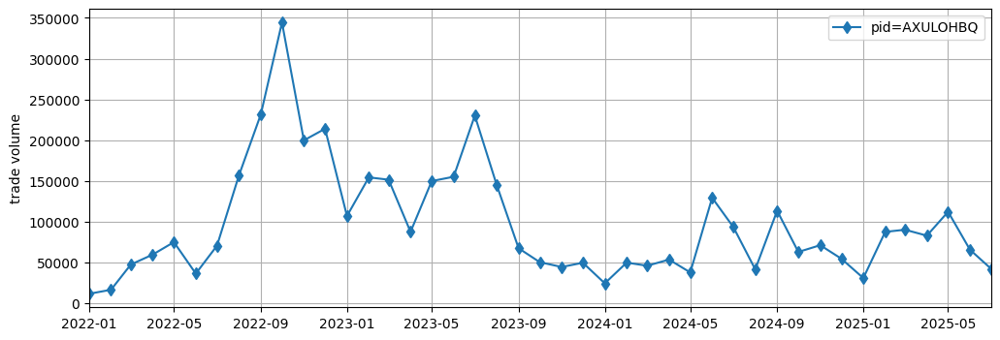

In [118]:
for i, group in enumerate(monthly.groupby('item_id')[['item_id','ym','value']]):
  print(f'i={i+1}, item name: {group[0]}')

  fig = plt.figure(figsize=(12,4))

  ax = plt.gca()
  # 상품별 월별 무역량(월 최대 3회 교역)
  ax.plot(group[1]['ym'], group[1]['value'], label=f'pid={group[0]}', marker='d')
  ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
  ax.legend()
  ax.grid()
  if i==5: break

plt.ylabel('trade volume')
plt.show()

#월별 합계로 집계한 후, 품목별 시계열을 선그래프로 시각화하여 (1) 월 단위 집계가 의도대로 수행되었는지, (2) 0값/결측 처리에 의해 시계열이 왜곡되지 않는지, (3) 스케일 차이 및 급격한 구조 변화(스파이크, 레벨 쉬프트)가 존재하는지 확인하였다. 그 결과 품목별 변동성과 스케일 차이가 커서 로그 변환 및 분석 대상 필터링(관측월 수 기준)이 필요하다고 판단하여, 이후 상관/CCF/Granger 분석은 변환된 시계열을 기반으로 수행하였다.

공행성 후보 선정

top20_hs4 : [2805 3824 8501 2811 8102 8505 3815 2807 7207 2846 3102 2529 8714 1210
 2002 2701 2612 2501 2102 2836]
top1_hs4=2805, 6개 아이템, ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']
index = 10, 1th item, item name: BSRMSVTC
index = 17, 2th item, item name: DJBLNPNC
index = 66, 3th item, item name: RCBZUSIM
index = 76, 4th item, item name: SUOYXCHP
index = 90, 5th item, item name: WQMVCOEM
index = 99, 6th item, item name: ZKENOUDA


,item_id,ym,value
323,BSRMSVTC,2022-01-01,1216269.0
324,BSRMSVTC,2022-02-01,156005.0
325,BSRMSVTC,2022-03-01,801085.0
326,BSRMSVTC,2022-04-01,365605.0
327,BSRMSVTC,2022-05-01,168725.0
...,...,...,...
3728,ZKENOUDA,2025-03-01,319283.0
3729,ZKENOUDA,2025-04-01,443958.0
3730,ZKENOUDA,2025-05-01,329906.0
3731,ZKENOUDA,2025-06-01,461599.0


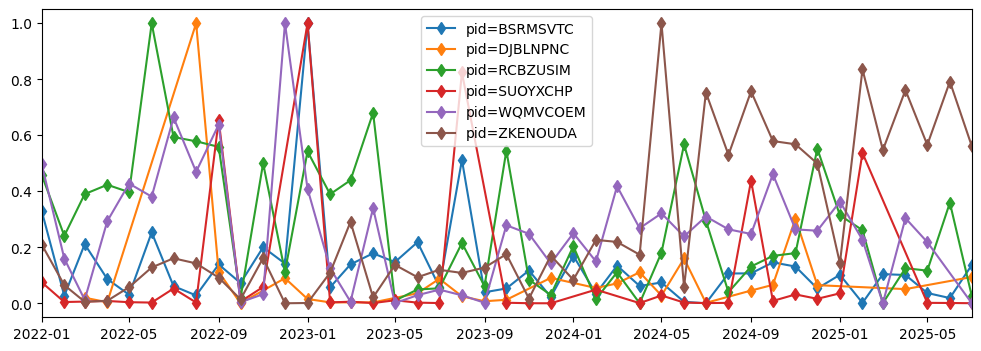

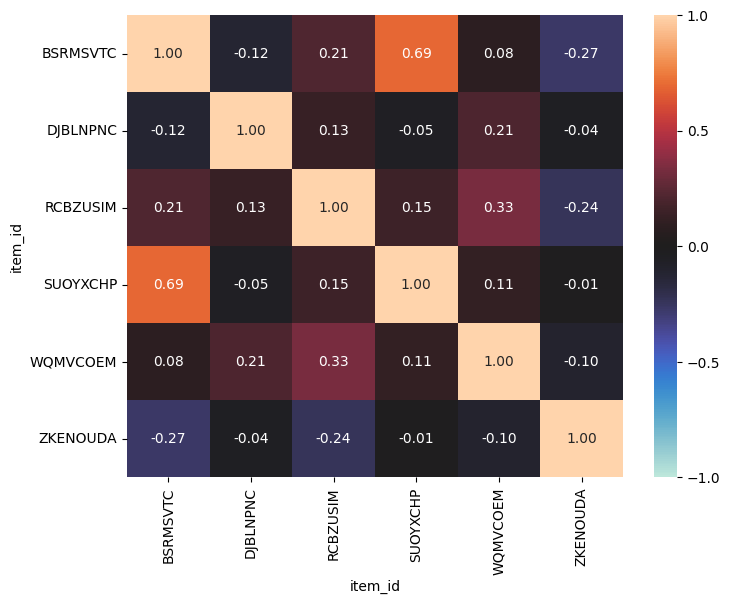

In [119]:
topN_hs4 = hs4_tmp_df['hs4'].values
print(f'top20_hs4 : {topN_hs4[:20]}') # [2805 3824 8501 2811 8102 8505 3815 2807 7207 2846 3102 2529 8714 1210 2002 2701 2612 2501 2102 2836]


sel_topN_hs4 = 1
print(f'top{sel_topN_hs4}_hs4={topN_hs4[sel_topN_hs4-1]}, {len(dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]])}개 아이템, {dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]}')
# top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

df_hm_plot = pd.DataFrame()
j= 0
fig = plt.figure(figsize=(12,4))
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        df_hm_plot = pd.concat([df_hm_plot, group[1]], axis=0)

        ax = plt.gca()
        ax.plot(group[1]["ym"], (group[1]["value"]- group[1]["value"].min())/(group[1]["value"].max()- group[1]["value"].min()), label=f'pid={group[0]}', marker='d')

        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()


display(df_hm_plot)
fig_sns = plt.figure(figsize=(8,6))
corr_mat= pd.pivot_table(df_hm_plot, index='ym', columns='item_id', values='value', fill_value=0).corr()
sns.heatmap(corr_mat, annot=True, fmt=".2f",vmin=-1, vmax=1, cbar_kws={'ticks': [-1, -0.5, 0, 0.5, 1]}, center=0 )

plt.show()

#HS4=2805에 속한 6개 품목의 월별 수출금액 시계열을 비교한 결과, 일부 품목 간 높은 양의 상관관계(예: BSRMSVTC–SUOYXCHP, r=0.69)가 확인되었다. 이는 산업군 내부에서 공통적인 수요·공급 요인의 영향을 받을 가능성을 시사한다. 다만 단순 상관은 인과를 의미하지 않으므로 이후 CCF 및 Granger 검정을 통해 선행·후행 관계를 추가로 분석하였다.

top2_hs4=3824, 5개 아이템, ['FCYBOAXC' 'IGDVVKUD' 'LPHPPJUG' 'PYZMVUWD' 'SNHYOVBM']
index = 22, 1th item, item name: FCYBOAXC
index = 35, 2th item, item name: IGDVVKUD
index = 45, 3th item, item name: LPHPPJUG
index = 59, 4th item, item name: PYZMVUWD
index = 74, 5th item, item name: SNHYOVBM


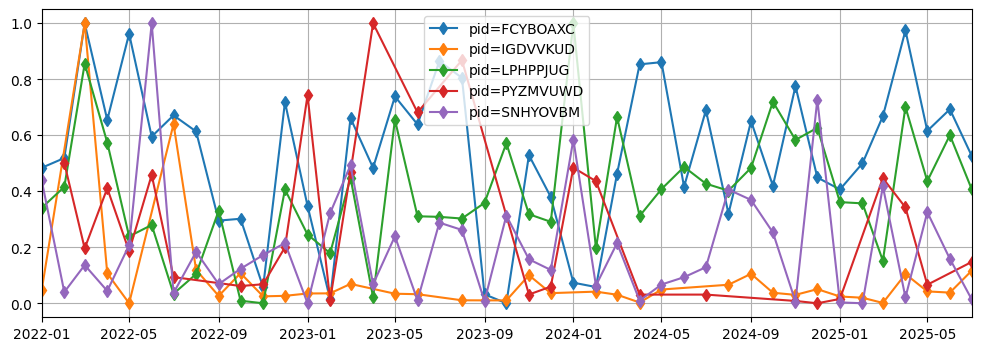

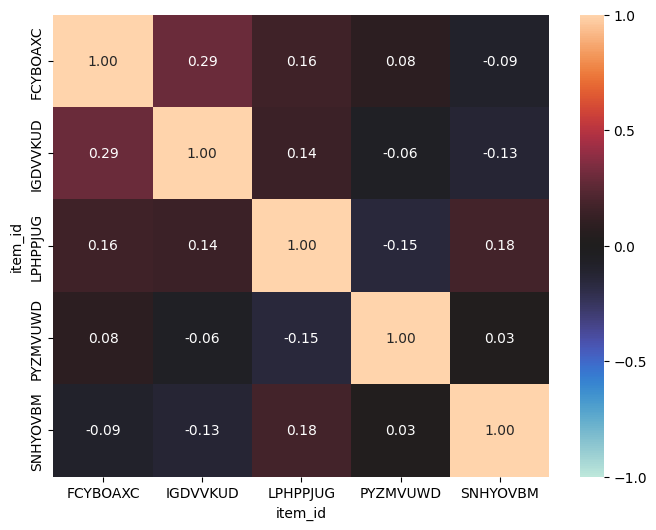

In [120]:
sel_topN_hs4 = 2
print(f'top{sel_topN_hs4}_hs4={topN_hs4[sel_topN_hs4-1]}, {len(dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]])}개 아이템, {dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]}')
# top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

df_hm_plot = pd.DataFrame()
j= 0
fig = plt.figure(figsize=(12,4))
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        df_hm_plot = pd.concat([df_hm_plot, group[1]], axis=0)

        ax = plt.gca()
        ax.plot(group[1]["ym"], (group[1]["value"]- group[1]["value"].min())/(group[1]["value"].max()- group[1]["value"].min()), label=f'pid={group[0]}', marker='d')
        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()


fig_sns = plt.figure(figsize=(8,6))
corr_mat= pd.pivot_table(df_hm_plot, index='ym', columns='item_id', values='value', fill_value=0).corr()
sns.heatmap(corr_mat, annot=True, fmt=".2f", vmin=-1, vmax=1, cbar_kws={'ticks': [-1, -0.5, 0, 0.5, 1]}, center=0)
plt.show()

#HS4=2805 산업군에서는 일부 품목 간 높은 양의 상관관계가 관찰된 반면, HS4=3824 산업군에서는 전반적으로 낮은 상관계수를 보였다. 이는 산업군별로 내부 동행성 구조가 상이함을 시사한다.

top3_hs4=8501, 5개 아이템, ['GKQIJYDH' 'KFQSHBNH' 'QKXNTIIB' 'RJCAXSGH' 'UQYUIVVR']
index = 30, 1th item, item name: GKQIJYDH
index = 42, 2th item, item name: KFQSHBNH
index = 61, 3th item, item name: QKXNTIIB
index = 67, 4th item, item name: RJCAXSGH
index = 81, 5th item, item name: UQYUIVVR


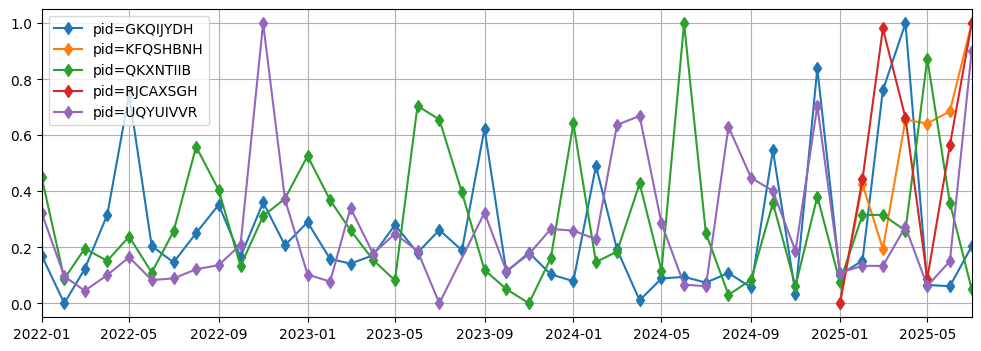

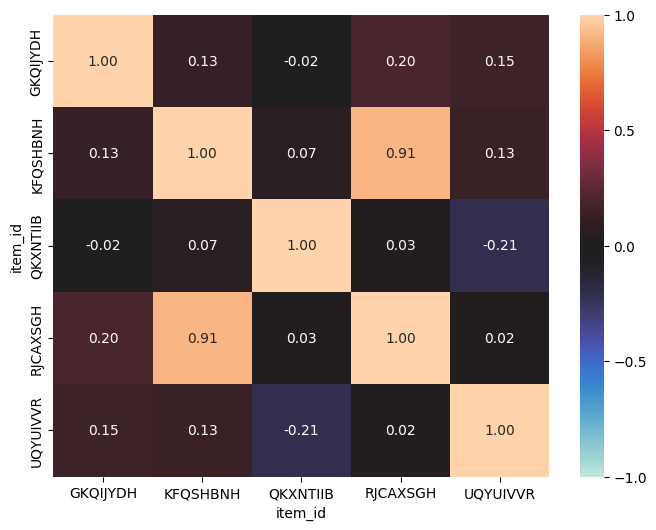

In [121]:
sel_topN_hs4 = 3
print(f'top{sel_topN_hs4}_hs4={topN_hs4[sel_topN_hs4-1]}, {len(dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]])}개 아이템, {dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]}')
# top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

df_hm_plot = pd.DataFrame()
j= 0
fig = plt.figure(figsize=(12,4))
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        df_hm_plot = pd.concat([df_hm_plot, group[1]], axis=0)

        ax = plt.gca()
        ax.plot(group[1]["ym"], (group[1]["value"]- group[1]["value"].min())/(group[1]["value"].max()- group[1]["value"].min()), label=f'pid={group[0]}', marker='d')
        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()


fig_sns = plt.figure(figsize=(8,6))
corr_mat= pd.pivot_table(df_hm_plot, index='ym', columns='item_id', values='value', fill_value=0).corr()
sns.heatmap(corr_mat, annot=True, fmt=".2f", vmin=-1, vmax=1, cbar_kws={'ticks': [-1, -0.5, 0, 0.5, 1]}, center=0)
plt.show()

#HS4=8501 산업군 내부에서 KFQSHBNH와 RJCAXSGH 간 매우 높은 상관계수(r=0.91)가 관찰되었다. 이는 두 품목이 동일한 수요·공급 요인의 영향을 받을 가능성을 시사하며, 이후 CCF 및 Granger 검정을 통해 선행·후행 관계를 추가 분석하였다.

top4_hs4=2811, 4개 아이템, ['DNMPSKTB' 'RJGPVEXX' 'VWMBASNE' 'WPQXWHYO']
index = 18, 1th item, item name: DNMPSKTB
index = 68, 2th item, item name: RJGPVEXX
index = 86, 3th item, item name: VWMBASNE
index = 89, 4th item, item name: WPQXWHYO


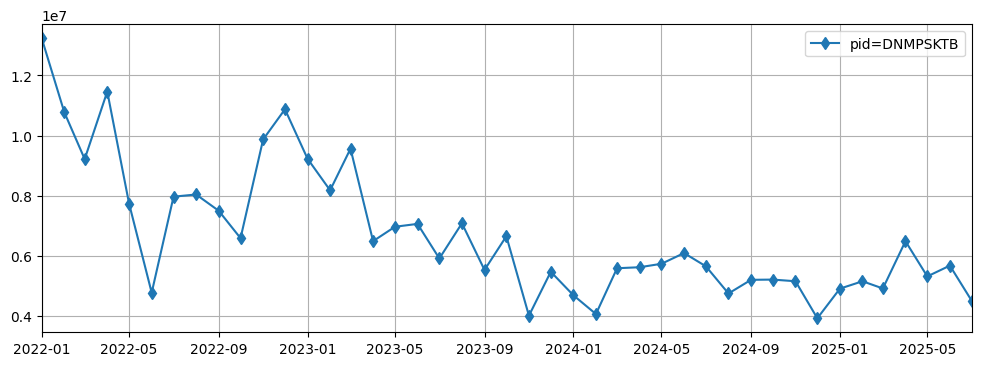

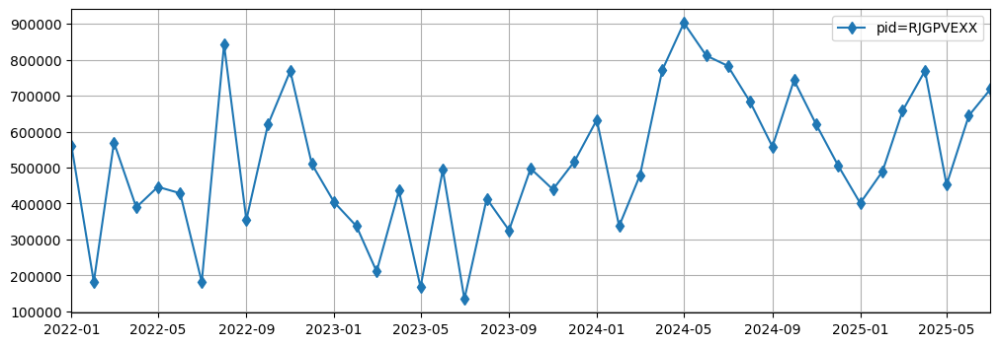

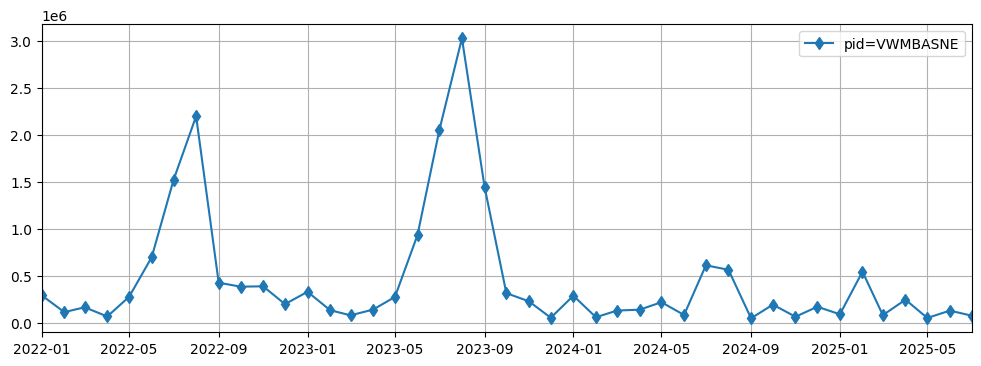

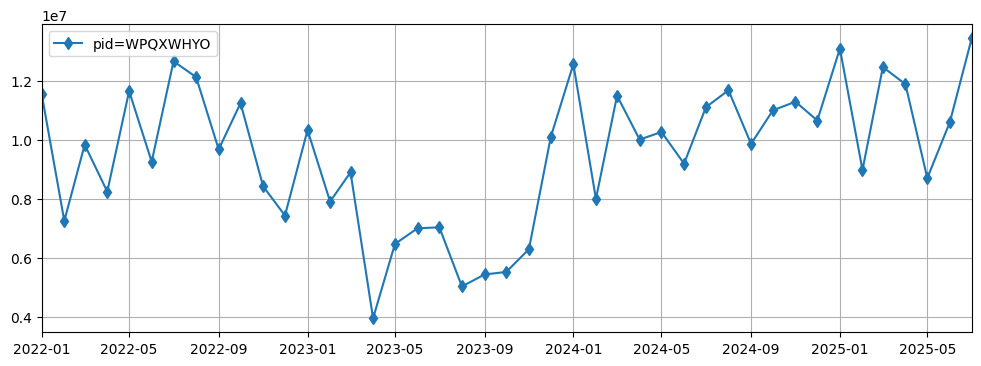

In [122]:
sel_topN_hs4 = 4
print(f'top{sel_topN_hs4}_hs4={topN_hs4[sel_topN_hs4-1]}, {len(dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]])}개 아이템, {dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]}') # top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

j= 0
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        fig = plt.figure(figsize=(12,4))

        ax = plt.gca()
        ax.plot(group[1]["ym"], group[1]["value"], label=f'pid={group[0]}', marker='d')
        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()

top4_hs4=2811, 4개 아이템, ['DNMPSKTB' 'RJGPVEXX' 'VWMBASNE' 'WPQXWHYO']
index = 18, 1th item, item name: DNMPSKTB
index = 68, 2th item, item name: RJGPVEXX
index = 86, 3th item, item name: VWMBASNE
index = 89, 4th item, item name: WPQXWHYO


<Axes: xlabel='item_id', ylabel='item_id'>

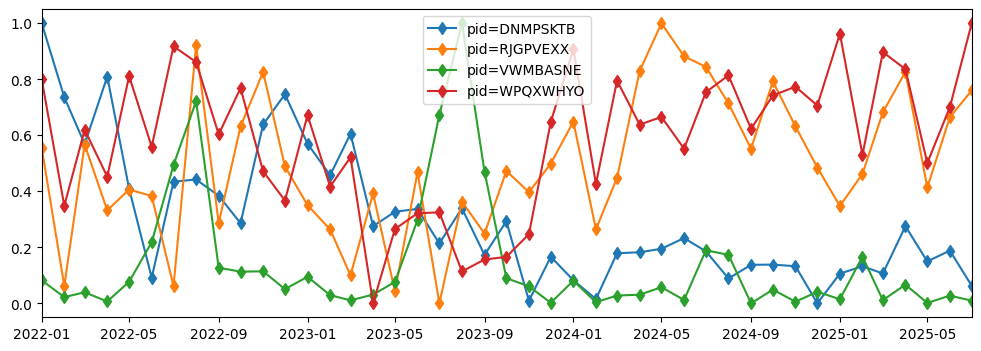

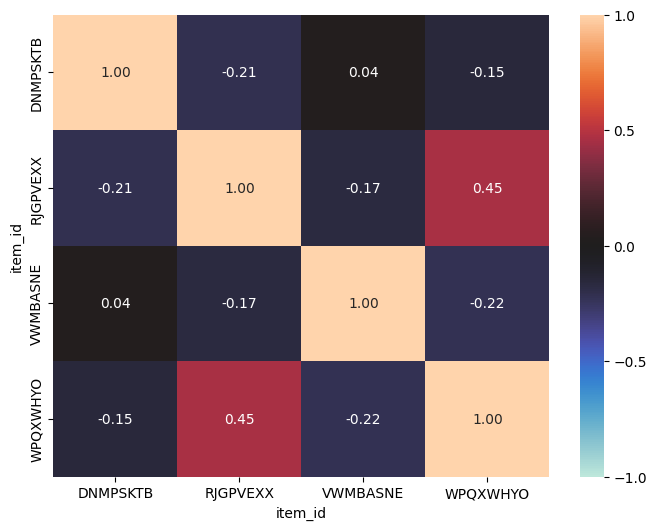

In [123]:
sel_topN_hs4 = 4
print(f'top{sel_topN_hs4}_hs4={topN_hs4[sel_topN_hs4-1]}, {len(dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]])}개 아이템, {dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]}') # top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

df_hm_plot = pd.DataFrame()
j= 0
fig = plt.figure(figsize=(12,4))
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        df_hm_plot = pd.concat([df_hm_plot, group[1]], axis=0)

        ax = plt.gca()
        ax.plot(group[1]["ym"], (group[1]["value"]- group[1]["value"].min())/(group[1]["value"].max()- group[1]["value"].min()), label=f'pid={group[0]}', marker='d')
        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()


fig_sns = plt.figure(figsize=(8,6))
corr_mat= pd.pivot_table(df_hm_plot, index='ym', columns='item_id', values='value', fill_value=0).corr()
sns.heatmap(corr_mat, annot=True, fmt=".2f",vmin=-1, vmax=1, cbar_kws={'ticks': [-1, -0.5, 0, 0.5, 1]}, center=0)

top5_hs4=8102, 3개 아이템, ['FQCLOEXA' 'KEUWZRKO' 'UIFPPCLR']
index = 25, 1th item, item name: FQCLOEXA
index = 41, 2th item, item name: KEUWZRKO
index = 80, 3th item, item name: UIFPPCLR


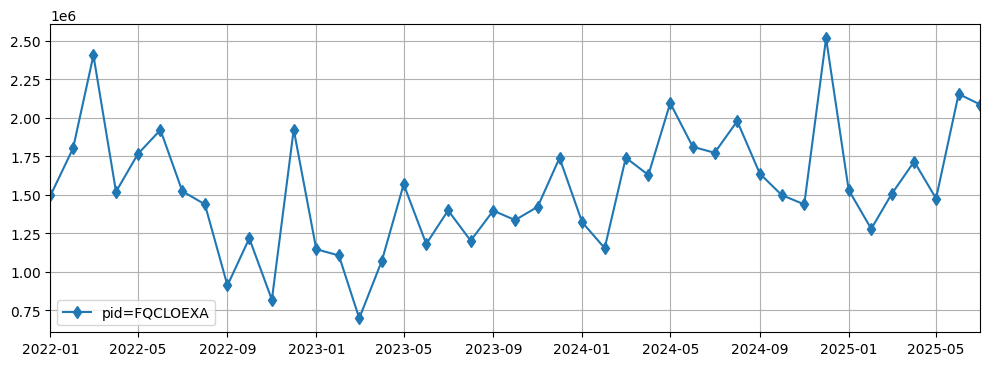

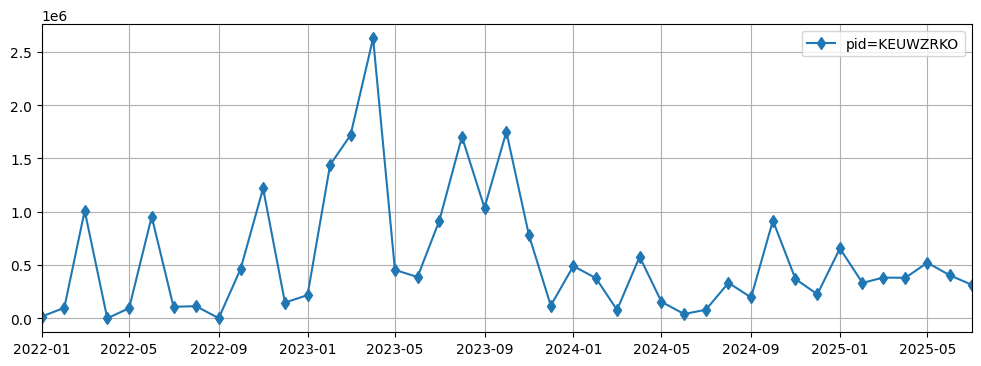

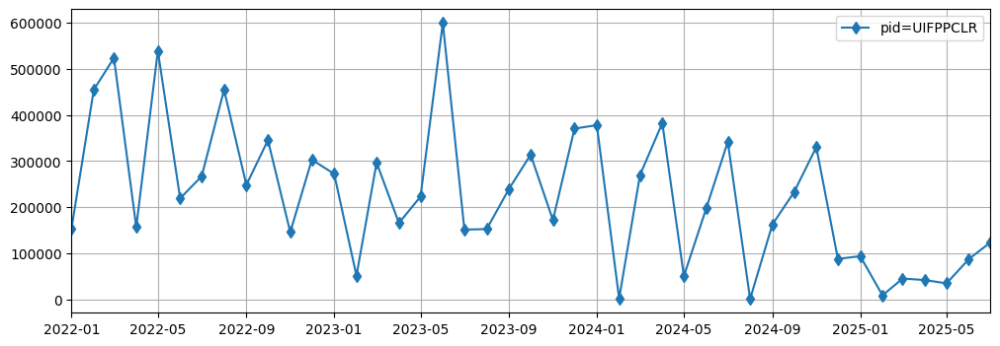

In [124]:
sel_topN_hs4 = 5
print(f'top{sel_topN_hs4}_hs4={topN_hs4[sel_topN_hs4-1]}, {len(dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]])}개 아이템, {dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]}') # top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

j= 0
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        fig = plt.figure(figsize=(12,4))

        ax = plt.gca()
        ax.plot(group[1]["ym"], group[1]["value"], label=f'pid={group[0]}', marker='d')
        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()

plt.show()

top5_hs4=8102, 3개 아이템, ['FQCLOEXA' 'KEUWZRKO' 'UIFPPCLR']
index = 25, 1th item, item name: FQCLOEXA
index = 41, 2th item, item name: KEUWZRKO
index = 80, 3th item, item name: UIFPPCLR


<Axes: xlabel='item_id', ylabel='item_id'>

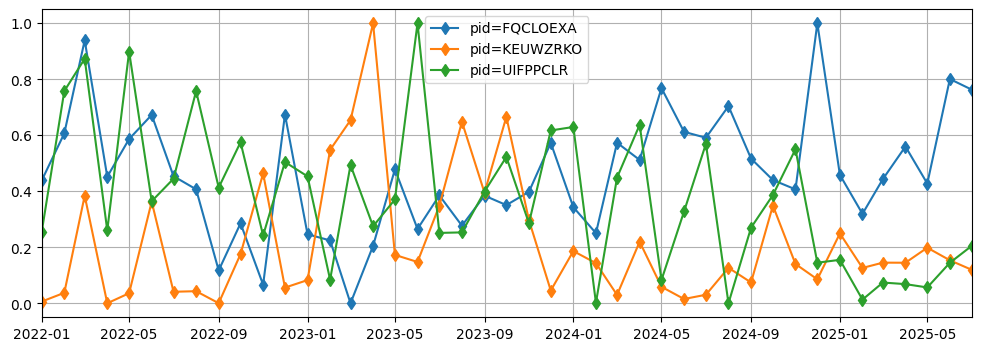

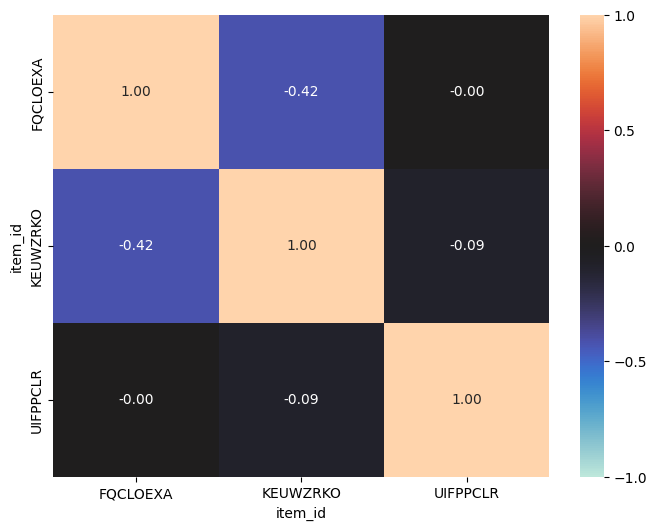

In [125]:
sel_topN_hs4 = 5
print(f'top{sel_topN_hs4}_hs4={topN_hs4[sel_topN_hs4-1]}, {len(dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]])}개 아이템, {dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]}') # top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

df_hm_plot = pd.DataFrame()
j= 0
fig = plt.figure(figsize=(12,4))
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        df_hm_plot = pd.concat([df_hm_plot, group[1]], axis=0)

        ax = plt.gca()
        ax.plot(group[1]["ym"], (group[1]["value"]- group[1]["value"].min())/(group[1]["value"].max()- group[1]["value"].min()), label=f'pid={group[0]}', marker='d')
        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()


fig_sns = plt.figure(figsize=(8,6))
corr_mat= pd.pivot_table(df_hm_plot, index='ym', columns='item_id', values='value', fill_value=0).corr()
sns.heatmap(corr_mat, annot=True, fmt=".2f",vmin=-1, vmax=1, cbar_kws={'ticks': [-1, -0.5, 0, 0.5, 1]}, center=0)

top6_hs4=8505, 3개 아이템, ['GYHKIVQT' 'ROACSLMG' 'VBYCLTYZ']
index = 32, 1th item, item name: GYHKIVQT
index = 69, 2th item, item name: ROACSLMG
index = 83, 3th item, item name: VBYCLTYZ


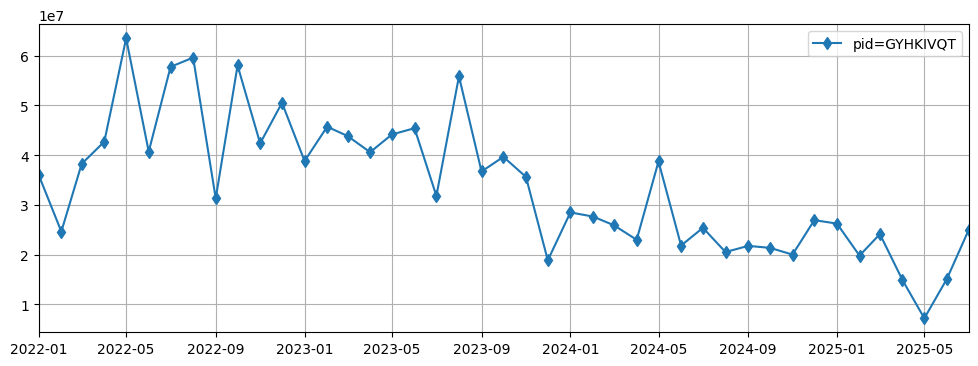

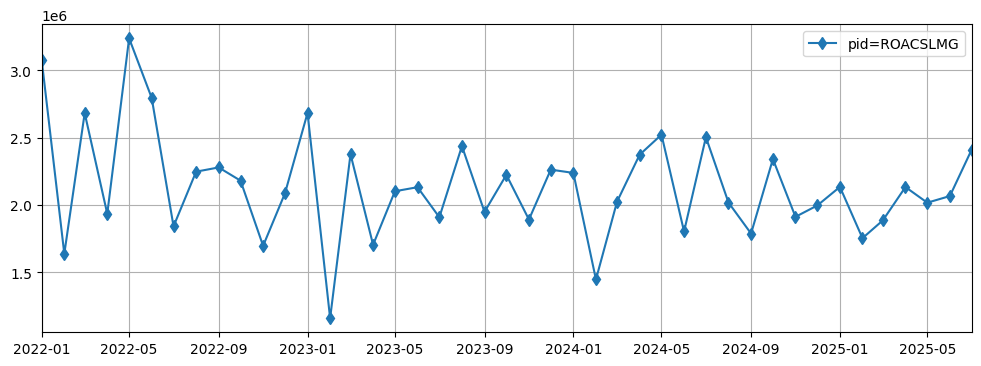

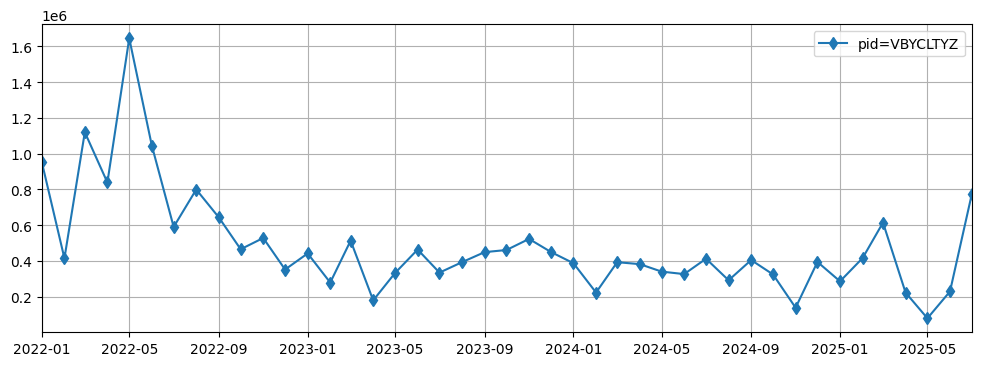

In [126]:
sel_topN_hs4 = 6
print(f'top{sel_topN_hs4}_hs4={topN_hs4[sel_topN_hs4-1]}, {len(dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]])}개 아이템, {dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]}') # top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

j= 0
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        fig = plt.figure(figsize=(12,4))

        ax = plt.gca()
        ax.plot(group[1]["ym"], group[1]["value"], label=f'pid={group[0]}', marker='d')
        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()

top6_hs4=8505, 3개 아이템, ['GYHKIVQT' 'ROACSLMG' 'VBYCLTYZ']
index = 32, 1th item, item name: GYHKIVQT
index = 69, 2th item, item name: ROACSLMG
index = 83, 3th item, item name: VBYCLTYZ


<Axes: xlabel='item_id', ylabel='item_id'>

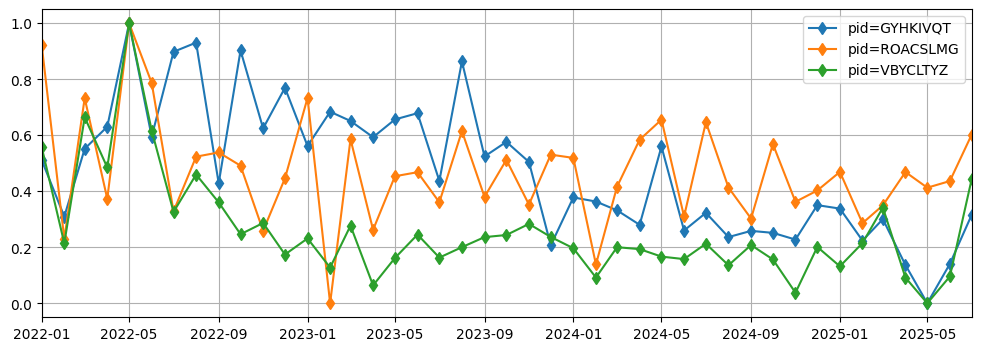

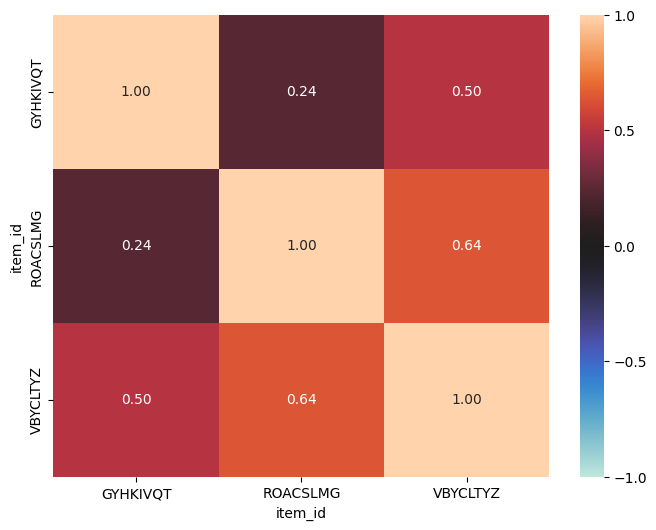

In [127]:
sel_topN_hs4 = 6
print(f'top{sel_topN_hs4}_hs4={topN_hs4[sel_topN_hs4-1]}, {len(dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]])}개 아이템, {dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]}') # top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

df_hm_plot = pd.DataFrame()
j= 0
fig = plt.figure(figsize=(12,4))
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        df_hm_plot = pd.concat([df_hm_plot, group[1]], axis=0)

        ax = plt.gca()
        ax.plot(group[1]["ym"], (group[1]["value"]- group[1]["value"].min())/(group[1]["value"].max()- group[1]["value"].min()), label=f'pid={group[0]}', marker='d')
        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()

fig_sns = plt.figure(figsize=(8,6))
corr_mat= pd.pivot_table(df_hm_plot, index='ym', columns='item_id', values='value', fill_value=0).corr()
sns.heatmap(corr_mat, annot=True, fmt=".2f",vmin=-1, vmax=1, cbar_kws={'ticks': [-1, -0.5, 0, 0.5, 1]}, center=0)

top7_hs4=3815, 3개 아이템, ['OJIFIHMZ' 'STZDBITS' 'XIIEJNEE']
index = 55, 1th item, item name: OJIFIHMZ
index = 75, 2th item, item name: STZDBITS
index = 92, 3th item, item name: XIIEJNEE


<Axes: xlabel='item_id', ylabel='item_id'>

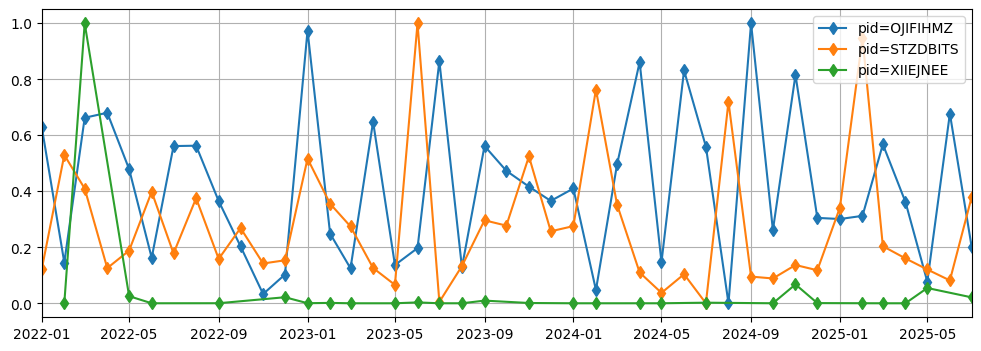

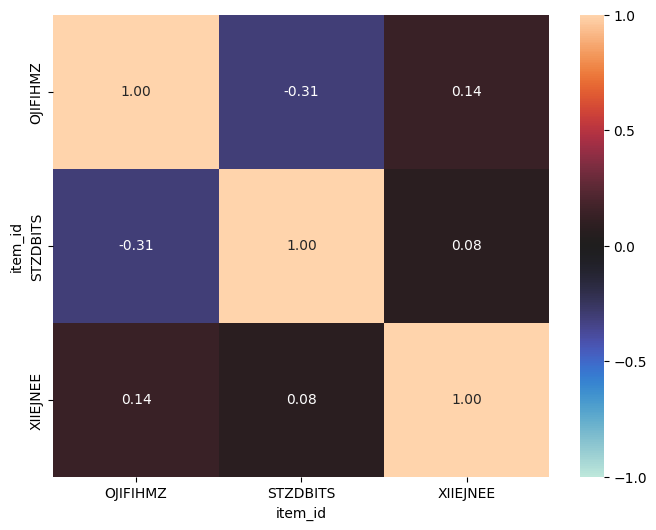

In [128]:
sel_topN_hs4 = 7
print(f'top{sel_topN_hs4}_hs4={topN_hs4[sel_topN_hs4-1]}, {len(dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]])}개 아이템, {dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]}') # top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

df_hm_plot = pd.DataFrame()
j= 0
fig = plt.figure(figsize=(12,4))
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        df_hm_plot = pd.concat([df_hm_plot, group[1]], axis=0)

        ax = plt.gca()
        ax.plot(group[1]["ym"], (group[1]["value"]- group[1]["value"].min())/(group[1]["value"].max()- group[1]["value"].min()), label=f'pid={group[0]}', marker='d')
        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()

fig_sns = plt.figure(figsize=(8,6))
corr_mat= pd.pivot_table(df_hm_plot, index='ym', columns='item_id', values='value', fill_value=0).corr()
sns.heatmap(corr_mat, annot=True, fmt=".2f",vmin=-1, vmax=1, cbar_kws={'ticks': [-1, -0.5, 0, 0.5, 1]}, center=0)

top8_hs4=2807, 3개 아이템, ['DDEXPPXU' 'LLHREMKS' 'YSYHGLQK']
index = 15, 1th item, item name: DDEXPPXU
index = 44, 2th item, item name: LLHREMKS
index = 96, 3th item, item name: YSYHGLQK


<Axes: xlabel='item_id', ylabel='item_id'>

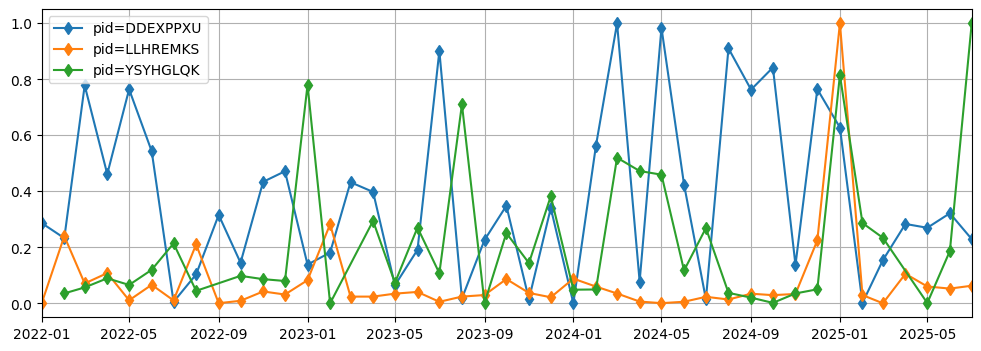

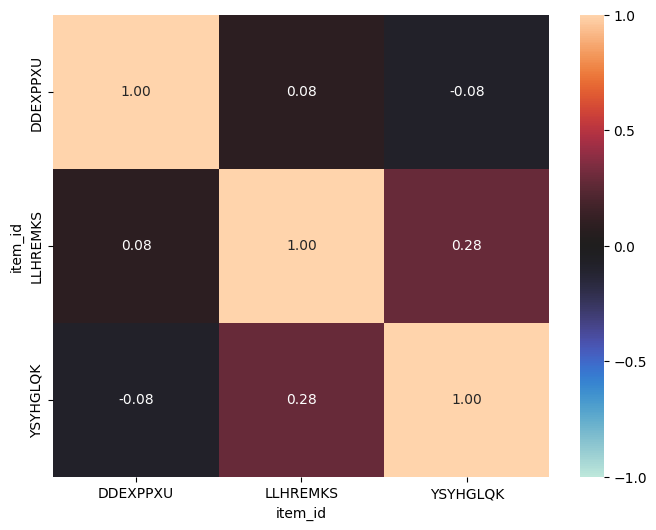

In [129]:
sel_topN_hs4 = 8
print(f'top{sel_topN_hs4}_hs4={topN_hs4[sel_topN_hs4-1]}, {len(dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]])}개 아이템, {dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]}') # top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

df_hm_plot = pd.DataFrame()
j= 0
fig = plt.figure(figsize=(12,4))
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        df_hm_plot = pd.concat([df_hm_plot, group[1]], axis=0)

        ax = plt.gca()
        ax.plot(group[1]["ym"], (group[1]["value"]- group[1]["value"].min())/(group[1]["value"].max()- group[1]["value"].min()), label=f'pid={group[0]}', marker='d')
        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()

fig_sns = plt.figure(figsize=(8,6))
corr_mat= pd.pivot_table(df_hm_plot, index='ym', columns='item_id', values='value', fill_value=0).corr()
sns.heatmap(corr_mat, annot=True, fmt=".2f",vmin=-1, vmax=1, cbar_kws={'ticks': [-1, -0.5, 0, 0.5, 1]}, center=0)

top9_hs4=7207, 2개 아이템, ['SDWAYPIK' 'TGOELCAG']
index = 73, 1th item, item name: SDWAYPIK
index = 78, 2th item, item name: TGOELCAG


<Axes: xlabel='item_id', ylabel='item_id'>

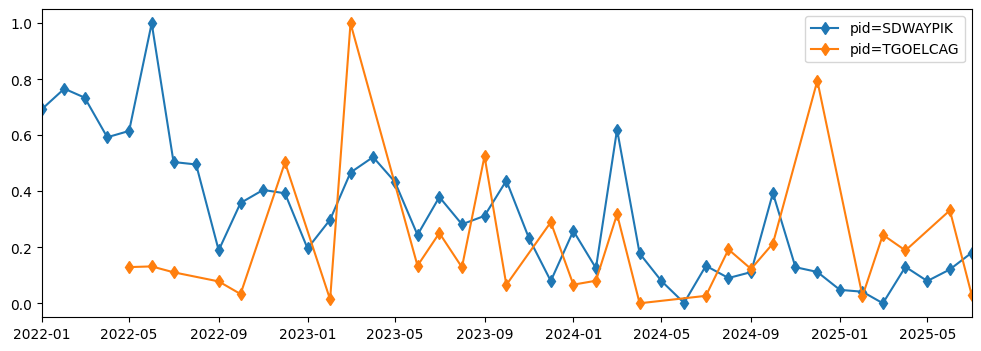

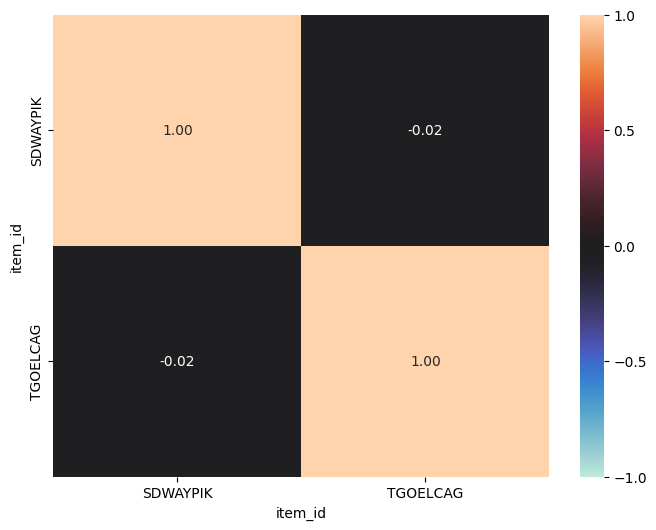

In [130]:
sel_topN_hs4 = 9
print(f'top{sel_topN_hs4}_hs4={topN_hs4[sel_topN_hs4-1]}, {len(dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]])}개 아이템, {dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]}') # top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

df_hm_plot = pd.DataFrame()
j= 0
fig = plt.figure(figsize=(12,4))
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        df_hm_plot = pd.concat([df_hm_plot, group[1]], axis=0)

        ax = plt.gca()
        ax.plot(group[1]["ym"], (group[1]["value"]- group[1]["value"].min())/(group[1]["value"].max()- group[1]["value"].min()), label=f'pid={group[0]}', marker='d')
        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()

fig_sns = plt.figure(figsize=(8,6))
corr_mat= pd.pivot_table(df_hm_plot, index='ym', columns='item_id', values='value', fill_value=0).corr()
sns.heatmap(corr_mat, annot=True, fmt=".2f",vmin=-1, vmax=1, cbar_kws={'ticks': [-1, -0.5, 0, 0.5, 1]}, center=0)

top10_hs4=2846, 2개 아이템, ['FRHNWLNI' 'MBSBZBXA']
index = 26, 1th item, item name: FRHNWLNI
index = 50, 2th item, item name: MBSBZBXA


<Axes: xlabel='item_id', ylabel='item_id'>

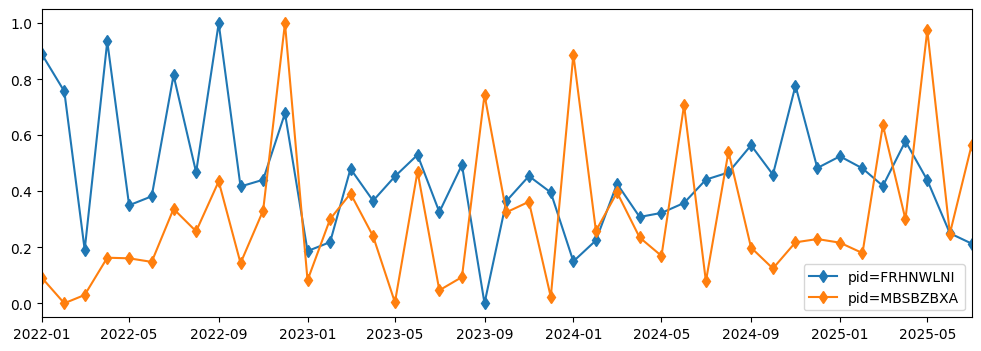

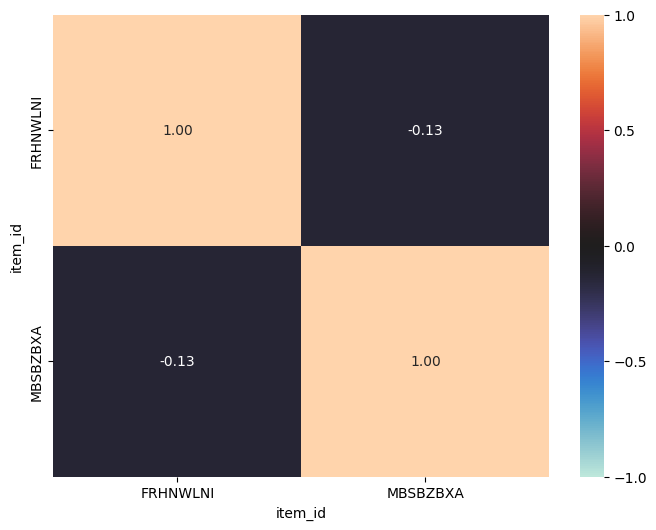

In [131]:
sel_topN_hs4 = 10
print(f'top{sel_topN_hs4}_hs4={topN_hs4[sel_topN_hs4-1]}, {len(dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]])}개 아이템, {dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]}') # top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

df_hm_plot = pd.DataFrame()
j= 0
fig = plt.figure(figsize=(12,4))
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        df_hm_plot = pd.concat([df_hm_plot, group[1]], axis=0)

        ax = plt.gca()
        ax.plot(group[1]["ym"], (group[1]["value"]- group[1]["value"].min())/(group[1]["value"].max()- group[1]["value"].min()), label=f'pid={group[0]}', marker='d')
        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()


fig_sns = plt.figure(figsize=(8,6))
corr_mat= pd.pivot_table(df_hm_plot, index='ym', columns='item_id', values='value', fill_value=0).corr()
sns.heatmap(corr_mat, annot=True, fmt=".2f",vmin=-1, vmax=1, cbar_kws={'ticks': [-1, -0.5, 0, 0.5, 1]}, center=0)

top11_hs4=3102, 2개 아이템, ['BTMOEMEP' 'LRVGFDFM']
index = 11, 1th item, item name: BTMOEMEP
index = 46, 2th item, item name: LRVGFDFM


<Axes: xlabel='item_id', ylabel='item_id'>

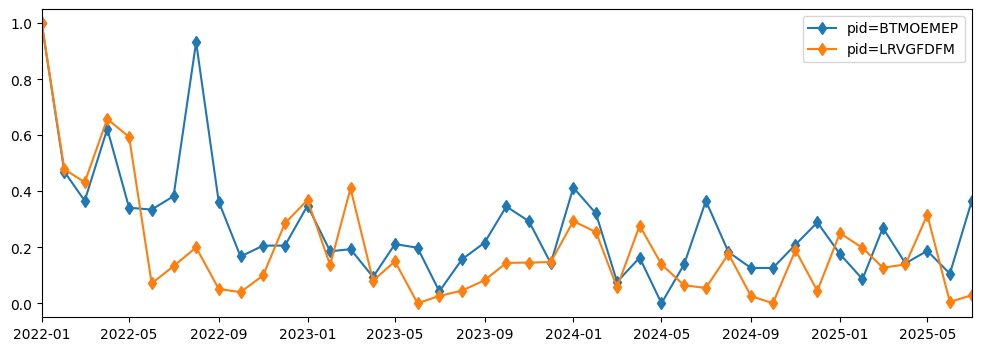

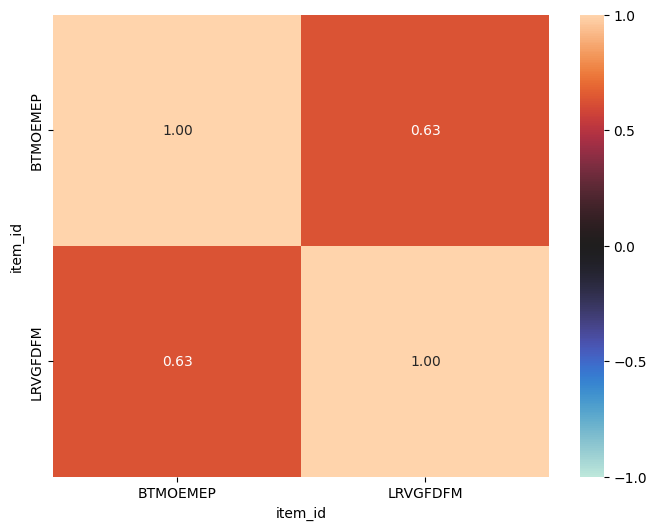

In [132]:
sel_topN_hs4 = 11
print(f'top{sel_topN_hs4}_hs4={topN_hs4[sel_topN_hs4-1]}, {len(dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]])}개 아이템, {dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]}') # top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

df_hm_plot = pd.DataFrame()
j= 0
fig = plt.figure(figsize=(12,4))
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        df_hm_plot = pd.concat([df_hm_plot, group[1]], axis=0)

        ax = plt.gca()
        ax.plot(group[1]["ym"], (group[1]["value"]- group[1]["value"].min())/(group[1]["value"].max()- group[1]["value"].min()), label=f'pid={group[0]}', marker='d')
        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()


fig_sns = plt.figure(figsize=(8,6))
corr_mat= pd.pivot_table(df_hm_plot, index='ym', columns='item_id', values='value', fill_value=0).corr()
sns.heatmap(corr_mat, annot=True, fmt=".2f",vmin=-1, vmax=1, cbar_kws={'ticks': [-1, -0.5, 0, 0.5, 1]}, center=0)

top12_hs4=2529, 2개 아이템, ['FTSVTTSR' 'XMKRPGLB']
index = 27, 1th item, item name: FTSVTTSR
index = 94, 2th item, item name: XMKRPGLB


<Axes: xlabel='item_id', ylabel='item_id'>

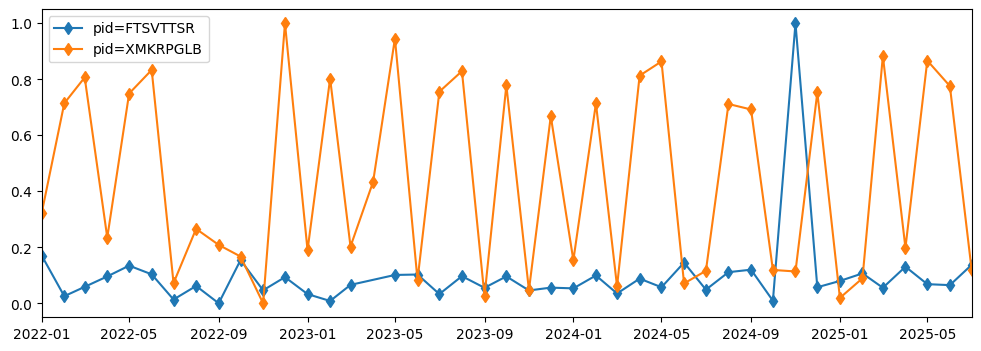

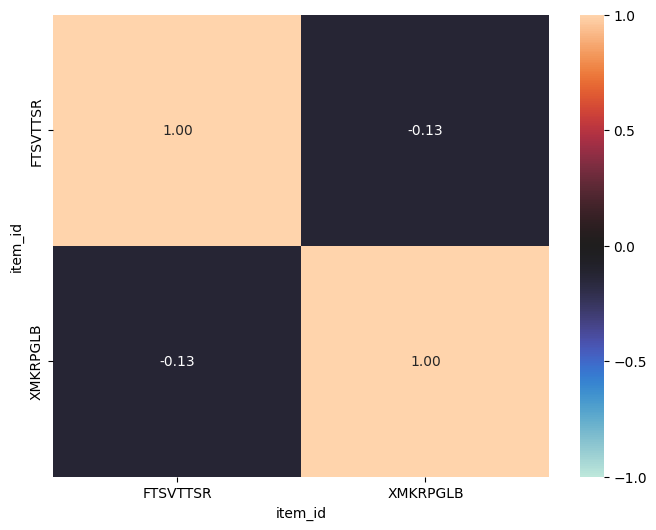

In [133]:
sel_topN_hs4 = 12
print(f'top{sel_topN_hs4}_hs4={topN_hs4[sel_topN_hs4-1]}, {len(dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]])}개 아이템, {dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]}') # top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

df_hm_plot = pd.DataFrame()
j= 0
fig = plt.figure(figsize=(12,4))
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        df_hm_plot = pd.concat([df_hm_plot, group[1]], axis=0)

        ax = plt.gca()
        ax.plot(group[1]["ym"], (group[1]["value"]- group[1]["value"].min())/(group[1]["value"].max()- group[1]["value"].min()), label=f'pid={group[0]}', marker='d')
        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()


fig_sns = plt.figure(figsize=(8,6))
corr_mat= pd.pivot_table(df_hm_plot, index='ym', columns='item_id', values='value', fill_value=0).corr()
sns.heatmap(corr_mat, annot=True, fmt=".2f",vmin=-1, vmax=1, cbar_kws={'ticks': [-1, -0.5, 0, 0.5, 1]}, center=0)

top13_hs4=8714, 2개 아이템, ['FITUEHWN' 'UGEQLMXM']
index = 24, 1th item, item name: FITUEHWN
index = 79, 2th item, item name: UGEQLMXM


<Axes: xlabel='item_id', ylabel='item_id'>

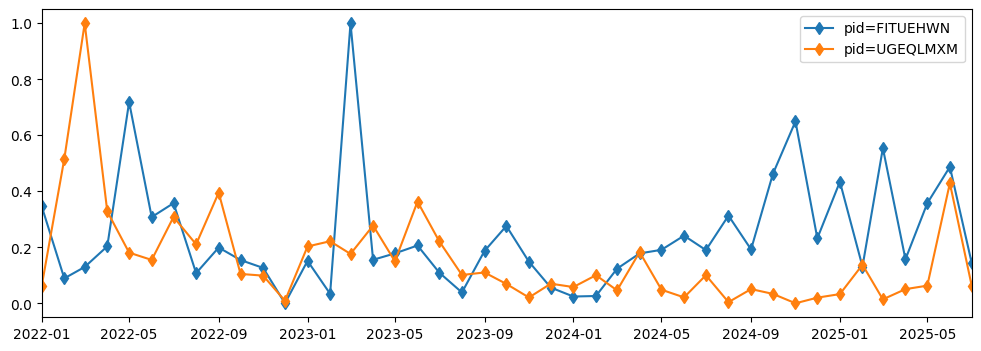

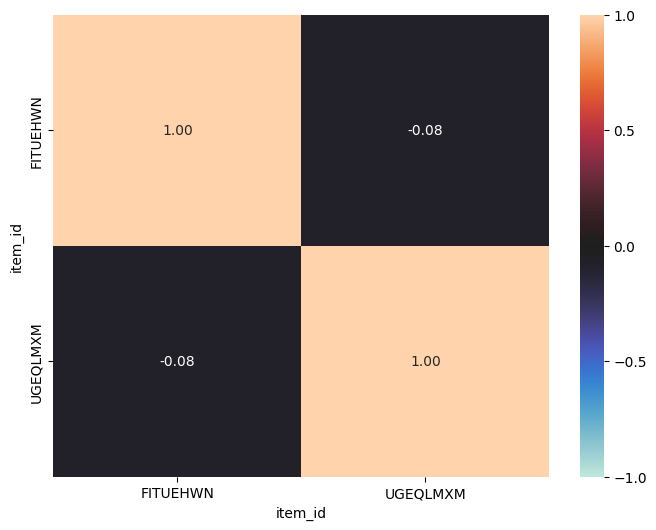

In [134]:
sel_topN_hs4 = 13
print(f'top{sel_topN_hs4}_hs4={topN_hs4[sel_topN_hs4-1]}, {len(dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]])}개 아이템, {dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]}') # top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

df_hm_plot = pd.DataFrame()
j= 0
fig = plt.figure(figsize=(12,4))
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        df_hm_plot = pd.concat([df_hm_plot, group[1]], axis=0)

        ax = plt.gca()
        ax.plot(group[1]["ym"], (group[1]["value"]- group[1]["value"].min())/(group[1]["value"].max()- group[1]["value"].min()), label=f'pid={group[0]}', marker='d')
        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()


fig_sns = plt.figure(figsize=(8,6))
corr_mat= pd.pivot_table(df_hm_plot, index='ym', columns='item_id', values='value', fill_value=0).corr()
sns.heatmap(corr_mat, annot=True, fmt=".2f",vmin=-1, vmax=1, cbar_kws={'ticks': [-1, -0.5, 0, 0.5, 1]}, center=0)

top14_hs4=1210, 1개 아이템, ['JBVHSUWY']
index = 36, 1th item, item name: JBVHSUWY


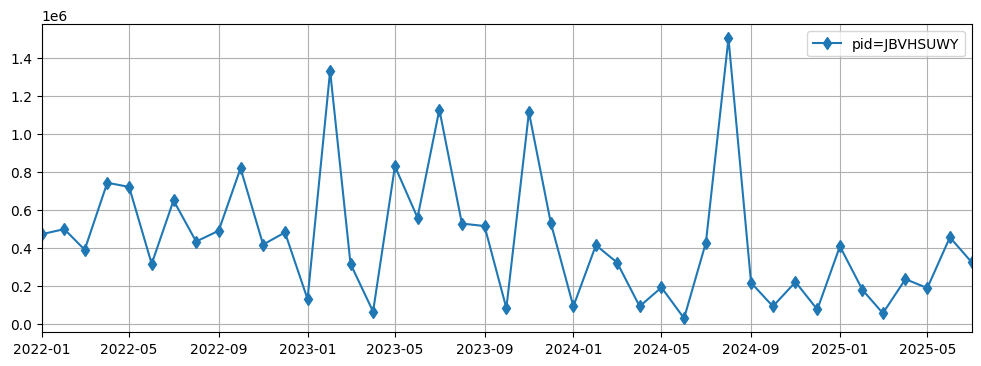

In [135]:
sel_topN_hs4 = 14
print(f'top{sel_topN_hs4}_hs4={topN_hs4[sel_topN_hs4-1]}, {len(dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]])}개 아이템, {dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]}') # top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

j= 0
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_hs4_tmp_df[topN_hs4[sel_topN_hs4-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        fig = plt.figure(figsize=(12,4))

        ax = plt.gca()
        ax.plot(group[1]["ym"], group[1]["value"], label=f'pid={group[0]}', marker='d')
        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()

In [136]:
### seq 값에 따른 item들의 범주
data.groupby('seq')['item_id'].apply(lambda x: len(set(x)))

#seq 값별 품목 구성을 확인한 결과, 대부분의 품목이 모든 seq 범주에 고르게 분포되어 있어 seq가 특정 품목에 종속적인 구조는 아닌 것으로 판단하였다. 이에 따라 월별 합계 집계 과정에서 구조적 편향은 없다고 보았다.

,item_id
seq,
1.0,99
2.0,100
3.0,100


In [137]:
data[data['item_id']=='AANGBULD'].head(20)

#특정 품목(AANGBULD)의 원자료를 직접 확인한 결과, 동일 월에 복수(seq=1~3) 거래가 존재하며 일부 seq에서는 value가 0으로 기록된 사례가 확인되었다. 이에 따라 월 단위 합계 집계를 수행하는 것이 타당하다고 판단하였다.

,item_id,year,month,seq,type,hs4,weight,quantity,value
122,AANGBULD,2022,1,2.0,1,4810,17625.0,0.0,14276.0
204,AANGBULD,2022,1,3.0,1,4810,0.0,0.0,0.0
456,AANGBULD,2022,2,3.0,1,4810,67983.0,0.0,52347.0
617,AANGBULD,2022,3,2.0,1,4810,69544.0,0.0,53549.0
705,AANGBULD,2022,3,3.0,1,4810,0.0,0.0,0.0
1120,AANGBULD,2022,5,2.0,1,4810,34173.0,0.0,26997.0
1212,AANGBULD,2022,5,3.0,1,4810,0.0,0.0,0.0
1294,AANGBULD,2022,6,1.0,1,4810,51859.0,0.0,42007.0
1375,AANGBULD,2022,6,2.0,1,4810,51807.0,0.0,42482.0
1463,AANGBULD,2022,6,3.0,1,4810,0.0,0.0,0.0


In [138]:
# seq별로 커버하는 item 범위 재확인
data[data['seq']==1.0]['item_id'].unique().shape, data[data['seq']==2.0]['item_id'].unique().shape, data[data['seq']==3.0]['item_id'].unique().shape

((99,), (100,), (100,))

In [139]:
# 시간 축 편향도 확인
data[data["seq"] == 1.0]['year'].unique().shape, data[data["seq"] == 2.0]['year'].unique().shape, data[data["seq"] == 3.0]['year'].unique().shape

((4,), (4,), (4,))

In [140]:
data[data["seq"] == 1.0]['month'].unique().shape, data[data["seq"] == 2.0]['month'].unique().shape, data[data["seq"] == 3.0]['month'].unique().shape

((12,), (12,), (12,))

In [141]:
data[data["seq"] == 1.0][['item_id','year', 'month']].groupby(['item_id', 'year']).size()

#seq=1 기준으로 품목별 연도별 월 관측 수를 확인한 결과, 일부 품목은 연간 12개월 모두 기록된 반면 일부 품목은 특정 연도에 관측월 수가 매우 적은 것으로 나타났다. 이에 따라 공행성 분석에서는 일정 수준 이상의 월 관측치를 가진 품목만을 대상으로 하였다.

item_id   year
AANGBULD  2022     1
          2023     1
          2024     4
AHMDUILJ  2022    12
          2023    12
                  ..
ZKENOUDA  2025     7
ZXERAXWP  2022    12
          2023    12
          2024    12
          2025     7
Length: 373, dtype: int64

In [142]:
# 중복검즏
data[data['seq']==1.0][['item_id','year','month']].groupby(['item_id','month']).size()

item_id   month
AANGBULD  2        1
          3        1
          6        1
          7        1
          8        1
                  ..
ZXERAXWP  8        3
          9        3
          10       3
          11       3
          12       3
Length: 1074, dtype: int64

In [143]:
pd.pivot_table(data, index='item_id', columns='year',values='seq',aggfunc='sum')

#품목별 연도별 seq 합계를 확인한 결과, 일부 품목은 모든 월에 걸쳐 안정적으로 거래가 발생한 반면 일부 품목은 특정 연도에 거래가 없거나 월 커버리지가 제한적인 것으로 나타났다. 이에 따라 공행성 분석은 연속적 월 관측치를 보유한 품목을 중심으로 수행하였다.

year,2022,2023,2024,2025
item_id,,,,
AANGBULD,30.0,29.0,57.0,19.0
AHMDUILJ,72.0,72.0,72.0,42.0
ANWUJOKX,25.0,9.0,NaN,6.0
APQGTRMF,69.0,67.0,62.0,41.0
ATLDMDBO,69.0,72.0,71.0,42.0
...,...,...,...,...
YSYHGLQK,56.0,62.0,62.0,30.0
ZCELVYQU,62.0,65.0,53.0,40.0
ZGJXVMNI,72.0,72.0,72.0,42.0


In [144]:
seq_pivot_df_cnt = pd.pivot_table(data, index='item_id', columns="month", values='seq',aggfunc='count', margins=True, margins_name="seq_total")
seq_pivot_df_cnt

month,1,2,3,4,5,6,7,8,9,10,11,12,seq_total
item_id,,,,,,,,,,,,,
AANGBULD,5.0,8.0,5.0,3.0,4.0,7.0,5.0,4.0,3.0,4.0,3.0,5.0,56
AHMDUILJ,12.0,12.0,12.0,12.0,12.0,12.0,12.0,9.0,9.0,9.0,9.0,9.0,129
ANWUJOKX,3.0,NaN,NaN,3.0,3.0,1.0,2.0,1.0,NaN,2.0,NaN,3.0,18
APQGTRMF,12.0,11.0,10.0,11.0,12.0,11.0,12.0,7.0,9.0,7.0,8.0,5.0,115
ATLDMDBO,12.0,12.0,11.0,12.0,12.0,11.0,11.0,9.0,9.0,9.0,8.0,9.0,125
...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZCELVYQU,10.0,10.0,9.0,12.0,10.0,11.0,11.0,3.0,7.0,6.0,7.0,9.0,105
ZGJXVMNI,12.0,12.0,12.0,12.0,12.0,12.0,12.0,9.0,9.0,9.0,9.0,9.0,129
ZKENOUDA,11.0,12.0,12.0,12.0,12.0,12.0,12.0,9.0,9.0,8.0,9.0,8.0,126


count :  [ 4.  1.  4.  0.  0.  0.  0.  1.  2.  3.  3.  1.  0.  1.  3.  1.  2.  5.
  4. 65.]
bins :  [  2.     8.35  14.7   21.05  27.4   33.75  40.1   46.45  52.8   59.15
  65.5   71.85  78.2   84.55  90.9   97.25 103.6  109.95 116.3  122.65
 129.  ]
container :  <BarContainer object of 20 artists>
2.0 ~ 8.35 : 4.0
8.35 ~ 14.7 : 1.0
14.7 ~ 21.049999999999997 : 4.0
21.049999999999997 ~ 27.4 : 0.0
27.4 ~ 33.75 : 0.0
33.75 ~ 40.099999999999994 : 0.0
40.099999999999994 ~ 46.449999999999996 : 0.0
46.449999999999996 ~ 52.8 : 1.0


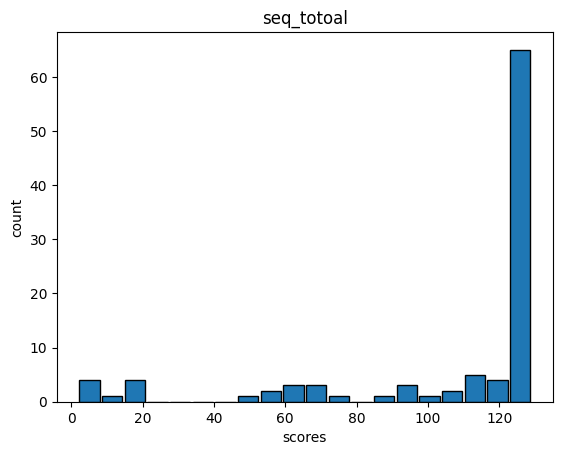

In [145]:
count, bins, container = plt.hist(seq_pivot_df_cnt['seq_total'].iloc[:-1], bins = 20, edgecolor='k',rwidth=.9)
print('count : ',count)
print('bins : ',bins)
print('container : ',container)

for i in range(8):
  print(f'{bins[i]} ~ {bins[i+1]} : {count[i]}')

plt.xlabel('scores')
plt.ylabel('count')
plt.title("seq_totoal")
plt.show()

#품목별 총 거래 건수(seq_total)의 분포를 확인한 결과, 거래 건수가 100 이상인 품목이 전체의 다수를 차지하는 반면 일부 품목은 거래 건수가 매우 적은 것으로 나타났다. 공행성 분석의 안정성을 위해 일정 수준 이상의 거래 밀도를 가진 품목만을 분석 대상으로 선정하였다.

In [146]:
# 40,80을 기준으로 3 범주로 나눈다 -> seq_cnt_low,seq_cnt_mid, seq_cnt_high
tmp_ser = seq_pivot_df_cnt['seq_total'].iloc[:-1]
dct_seq_total = pd.cut(tmp_ser, bins=[0,40,80,tmp_ser.max()], labels = ['seq_cnt_low','seq_cnt_mid','seq_cnt_high']).to_dict()
dct_seq_total

#품목별 총 거래 건수를 기준으로 거래 밀도 수준을 3단계로 구분하였다(low, mid, high). 공행성 및 인과 분석은 충분한 월별 관측치를 보유한 high 그룹을 중심으로 수행하여 통계적 안정성을 확보하였다.

{'AANGBULD': 'seq_cnt_mid',
 'AHMDUILJ': 'seq_cnt_high',
 'ANWUJOKX': 'seq_cnt_low',
 'APQGTRMF': 'seq_cnt_high',
 'ATLDMDBO': 'seq_cnt_high',
 'AXULOHBQ': 'seq_cnt_high',
 'BEZYMBBT': 'seq_cnt_high',
 'BJALXPFS': 'seq_cnt_high',
 'BLANHGYY': 'seq_cnt_mid',
 'BSRMSVTC': 'seq_cnt_high',
 'BTMOEMEP': 'seq_cnt_high',
 'BUZIIBYG': 'seq_cnt_high',
 'CCLHWFWF': 'seq_cnt_high',
 'DBWLZWNK': 'seq_cnt_high',
 'DDEXPPXU': 'seq_cnt_high',
 'DEWLVASR': 'seq_cnt_high',
 'DJBLNPNC': 'seq_cnt_mid',
 'DNMPSKTB': 'seq_cnt_high',
 'DUCMGGNW': 'seq_cnt_high',
 'ELQGMQWE': 'seq_cnt_high',
 'EVBVXETX': 'seq_cnt_high',
 'FCYBOAXC': 'seq_cnt_high',
 'FDXPMYGF': 'seq_cnt_high',
 'FITUEHWN': 'seq_cnt_high',
 'FQCLOEXA': 'seq_cnt_high',
 'FRHNWLNI': 'seq_cnt_high',
 'FTSVTTSR': 'seq_cnt_high',
 'FWUCPMMW': 'seq_cnt_mid',
 'GIKPEWTY': 'seq_cnt_low',
 'GKQIJYDH': 'seq_cnt_high',
 'GMBFCMIU': 'seq_cnt_low',
 'GYHKIVQT': 'seq_cnt_high',
 'HCDTGMST': 'seq_cnt_high',
 'HXYSSRXE': 'seq_cnt_high',
 'IGDVVKUD': 'seq_cnt

In [147]:
data_fe=data.copy()
data_fe['seq_cat'] = data_fe['item_id'].map(dct_seq_total)
data_fe

#거래 관측 밀도가 낮은 품목은 시계열 안정성이 떨어질 수 있으므로, 거래건수 상위 그룹(seq_cnt_high)을 중심으로 공행성 및 인과 분석을 수행하였다.

,item_id,year,month,seq,type,hs4,weight,quantity,value,seq_cat
0,DEWLVASR,2022,1,1.0,1,3038,14858.0,0.0,32688.0,seq_cnt_high
1,ELQGMQWE,2022,1,1.0,1,2002,62195.0,0.0,110617.0,seq_cnt_high
2,AHMDUILJ,2022,1,1.0,1,2102,18426.0,0.0,72766.0,seq_cnt_high
3,XIPPENFQ,2022,1,1.0,1,2501,20426.0,0.0,11172.0,seq_cnt_high
4,FTSVTTSR,2022,1,1.0,1,2529,248000.0,0.0,143004.0,seq_cnt_high
...,...,...,...,...,...,...,...,...,...,...
10831,XIFHSOWQ,2025,7,3.0,1,8708,352.0,0.0,12937.0,seq_cnt_high
10832,FITUEHWN,2025,7,3.0,1,8714,655.0,900.0,16054.0,seq_cnt_high
10833,UGEQLMXM,2025,7,3.0,1,8714,758.0,0.0,74377.0,seq_cnt_high
10834,BLANHGYY,2025,7,3.0,1,9022,345.0,2.0,69720.0,seq_cnt_mid


In [148]:
monthly_fe = monthly.copy()
monthly_fe['seq_cat'] = monthly_fe['item_id'].map(dct_seq_total)
monthly_fe

,item_id,year,month,value,ym,seq_cat
0,AANGBULD,2022,1,14276.0,2022-01-01,seq_cnt_mid
1,AANGBULD,2022,2,52347.0,2022-02-01,seq_cnt_mid
2,AANGBULD,2022,3,53549.0,2022-03-01,seq_cnt_mid
3,AANGBULD,2022,5,26997.0,2022-05-01,seq_cnt_mid
4,AANGBULD,2022,6,84489.0,2022-06-01,seq_cnt_mid
...,...,...,...,...,...,...
3771,ZXERAXWP,2025,3,12817.0,2025-03-01,seq_cnt_high
3772,ZXERAXWP,2025,4,12482.0,2025-04-01,seq_cnt_high
3773,ZXERAXWP,2025,5,18224.0,2025-05-01,seq_cnt_high
3774,ZXERAXWP,2025,6,42690.0,2025-06-01,seq_cnt_high


In [149]:
data_fe.groupby(['seq_cat'], as_index=False)['item_id'].apply(lambda x: np.unique(x))

,seq_cat,item_id
0,seq_cnt_high,"[AHMDUILJ, APQGTRMF, ATLDMDBO, AXULOHBQ, BEZYM..."
1,seq_cnt_low,"[ANWUJOKX, GIKPEWTY, GMBFCMIU, KFQSHBNH, PLMZA..."
2,seq_cnt_mid,"[AANGBULD, BLANHGYY, DJBLNPNC, FWUCPMMW, MIRCV..."


In [150]:
tmp_df_seq = data_fe.groupby(['seq_cat'], as_index=False)['item_id'].apply(lambda x: np.unique(x))
tmp_df_seq['seq_cat_len'] = data_fe.groupby(['seq_cat'])['item_id'].apply(lambda x: len(np.unique(x))).values
tmp_df_seq

,seq_cat,item_id,seq_cat_len
0,seq_cnt_high,"[AHMDUILJ, APQGTRMF, ATLDMDBO, AXULOHBQ, BEZYM...",81
1,seq_cnt_low,"[ANWUJOKX, GIKPEWTY, GMBFCMIU, KFQSHBNH, PLMZA...",9
2,seq_cnt_mid,"[AANGBULD, BLANHGYY, DJBLNPNC, FWUCPMMW, MIRCV...",10


In [151]:
dct_seq_cat = tmp_df_seq[['seq_cat','item_id']].set_index('seq_cat').to_dict()['item_id']
dct_seq_cat

{'seq_cnt_high': array(['AHMDUILJ', 'APQGTRMF', 'ATLDMDBO', 'AXULOHBQ', 'BEZYMBBT',
        'BJALXPFS', 'BSRMSVTC', 'BTMOEMEP', 'BUZIIBYG', 'CCLHWFWF',
        'DBWLZWNK', 'DDEXPPXU', 'DEWLVASR', 'DNMPSKTB', 'DUCMGGNW',
        'ELQGMQWE', 'EVBVXETX', 'FCYBOAXC', 'FDXPMYGF', 'FITUEHWN',
        'FQCLOEXA', 'FRHNWLNI', 'FTSVTTSR', 'GKQIJYDH', 'GYHKIVQT',
        'HCDTGMST', 'HXYSSRXE', 'IGDVVKUD', 'JBVHSUWY', 'JERHKLYW',
        'JPBRUTWP', 'JSLXRQOK', 'KAGJCHMR', 'KEUWZRKO', 'KJNSOAHR',
        'LLHREMKS', 'LPHPPJUG', 'LRVGFDFM', 'LSOIUSXD', 'LTOYKIML',
        'LUENUFGA', 'MBSBZBXA', 'NZKBIBNU', 'OJIFIHMZ', 'OKMBFVKS',
        'OXKURKXR', 'QJQJSWFU', 'QKXNTIIB', 'QRKRBYJL', 'QVLMOEYE',
        'RAWUKQMJ', 'RCBZUSIM', 'RJGPVEXX', 'ROACSLMG', 'SAAYMURU',
        'SAHWCZNH', 'SDWAYPIK', 'SNHYOVBM', 'STZDBITS', 'SUOYXCHP',
        'UGEQLMXM', 'UIFPPCLR', 'UQYUIVVR', 'UXSPKBJR', 'VBYCLTYZ',
        'VMAQSTJE', 'VUAFAIYJ', 'VWMBASNE', 'WBLJNPZQ', 'WHPUAOID',
        'WPQXWHYO', 'WQMVCOEM', 

In [152]:
topN_seq_cat = tmp_df_seq['seq_cat'].values
topN_seq_cat

array(['seq_cnt_high', 'seq_cnt_low', 'seq_cnt_mid'], dtype=object)

top1_seq_cat=seq_cnt_high, 81개 아이템, ['AHMDUILJ' 'APQGTRMF' 'ATLDMDBO' 'AXULOHBQ' 'BEZYMBBT' 'BJALXPFS'
 'BSRMSVTC' 'BTMOEMEP' 'BUZIIBYG' 'CCLHWFWF' 'DBWLZWNK' 'DDEXPPXU'
 'DEWLVASR' 'DNMPSKTB' 'DUCMGGNW' 'ELQGMQWE' 'EVBVXETX' 'FCYBOAXC'
 'FDXPMYGF' 'FITUEHWN' 'FQCLOEXA' 'FRHNWLNI' 'FTSVTTSR' 'GKQIJYDH'
 'GYHKIVQT' 'HCDTGMST' 'HXYSSRXE' 'IGDVVKUD' 'JBVHSUWY' 'JERHKLYW'
 'JPBRUTWP' 'JSLXRQOK' 'KAGJCHMR' 'KEUWZRKO' 'KJNSOAHR' 'LLHREMKS'
 'LPHPPJUG' 'LRVGFDFM' 'LSOIUSXD' 'LTOYKIML' 'LUENUFGA' 'MBSBZBXA'
 'NZKBIBNU' 'OJIFIHMZ' 'OKMBFVKS' 'OXKURKXR' 'QJQJSWFU' 'QKXNTIIB'
 'QRKRBYJL' 'QVLMOEYE' 'RAWUKQMJ' 'RCBZUSIM' 'RJGPVEXX' 'ROACSLMG'
 'SAAYMURU' 'SAHWCZNH' 'SDWAYPIK' 'SNHYOVBM' 'STZDBITS' 'SUOYXCHP'
 'UGEQLMXM' 'UIFPPCLR' 'UQYUIVVR' 'UXSPKBJR' 'VBYCLTYZ' 'VMAQSTJE'
 'VUAFAIYJ' 'VWMBASNE' 'WBLJNPZQ' 'WHPUAOID' 'WPQXWHYO' 'WQMVCOEM'
 'XIFHSOWQ' 'XIPPENFQ' 'XMKRPGLB' 'XUOIQPFL' 'YSYHGLQK' 'ZCELVYQU'
 'ZGJXVMNI' 'ZKENOUDA' 'ZXERAXWP']
index = 2, 1th item, item name: AHMDUILJ
index = 4, 2th it

,item_id,ym,value
29,AHMDUILJ,2022-01-01,242705.0
30,AHMDUILJ,2022-02-01,120847.0
31,AHMDUILJ,2022-03-01,197317.0
32,AHMDUILJ,2022-04-01,126142.0
33,AHMDUILJ,2022-05-01,71730.0
...,...,...,...
3771,ZXERAXWP,2025-03-01,12817.0
3772,ZXERAXWP,2025-04-01,12482.0
3773,ZXERAXWP,2025-05-01,18224.0
3774,ZXERAXWP,2025-06-01,42690.0


<Axes: xlabel='item_id', ylabel='item_id'>

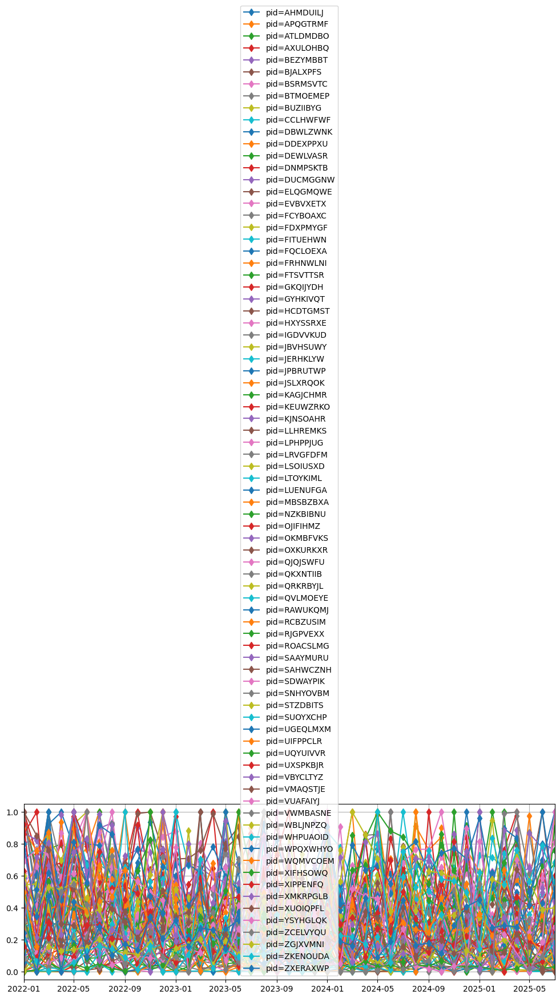

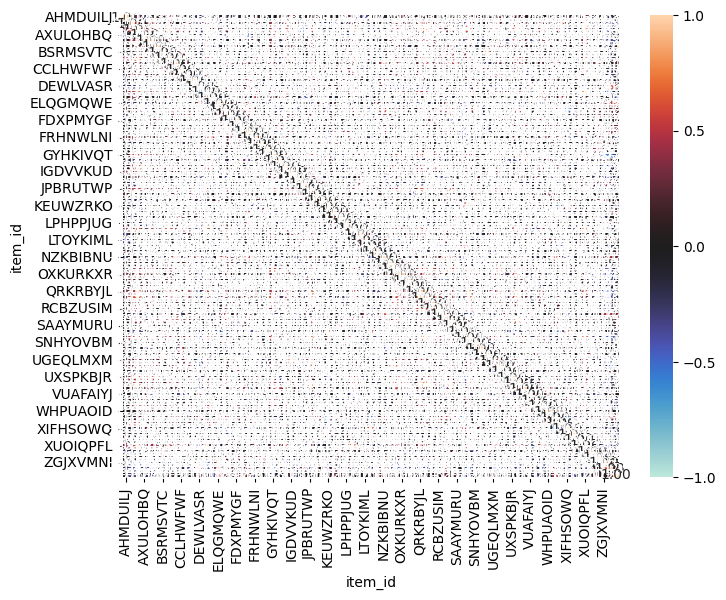

In [153]:
# sel_topN_seq_cat = 1 경우
sel_topN_seq_cat = 1
print(f'top{sel_topN_seq_cat}_seq_cat={topN_seq_cat[sel_topN_seq_cat-1]}, {len(dct_seq_cat[topN_seq_cat[sel_topN_seq_cat-1]])}개 아이템, {dct_seq_cat[topN_seq_cat[sel_topN_seq_cat-1]]}')
# top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

df_hm_plot = pd.DataFrame()
j= 0
fig = plt.figure(figsize=(12,4))
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_seq_cat[topN_seq_cat[sel_topN_seq_cat-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        df_hm_plot = pd.concat([df_hm_plot, group[1]], axis=0)

        ax = plt.gca()
        ax.plot(group[1]["ym"], (group[1]["value"]- group[1]["value"].min())/(group[1]["value"].max()- group[1]["value"].min()), label=f'pid={group[0]}', marker='d')

        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()


display(df_hm_plot)
fig_sns = plt.figure(figsize=(8,6))
corr_mat= pd.pivot_table(df_hm_plot, index='ym', columns='item_id', values='value', fill_value=0).corr()
sns.heatmap(corr_mat, annot=True, fmt=".2f",vmin=-1, vmax=1, cbar_kws={'ticks': [-1, -0.5, 0, 0.5, 1]}, center=0 )

# “구간화 결과 high 81개, mid 10개, low 9개로 분포하였으며, 이후 공행성 후보 탐색은 관측치가 충분한 high 그룹을 중심으로 수행하여 시계열 길이 부족으로 인한 왜곡을 최소화하였다.”


In [154]:
# 절댓값 0.5 이상만 확인
corr_mat[corr_mat.abs()>0.5]

item_id,AHMDUILJ,APQGTRMF,ATLDMDBO,AXULOHBQ,BEZYMBBT,BJALXPFS,BSRMSVTC,BTMOEMEP,BUZIIBYG,CCLHWFWF,...,WQMVCOEM,XIFHSOWQ,XIPPENFQ,XMKRPGLB,XUOIQPFL,YSYHGLQK,ZCELVYQU,ZGJXVMNI,ZKENOUDA,ZXERAXWP
item_id,,,,,,,,,,,,,,,,,,,,,
AHMDUILJ,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
APQGTRMF,NaN,1.000000,0.548979,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.586799,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ATLDMDBO,NaN,0.548979,1.000000,NaN,NaN,NaN,NaN,0.686812,NaN,NaN,...,NaN,NaN,NaN,NaN,0.707539,NaN,NaN,-0.528831,NaN,NaN
AXULOHBQ,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BEZYMBBT,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YSYHGLQK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
ZCELVYQU,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
ZGJXVMNI,NaN,NaN,-0.528831,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.616375,NaN


In [155]:
# corr값이 높은 짝을 필터링
high_corr = []
for i, row in enumerate(corr_mat[(corr_mat.abs()>0.6) & corr_mat[(corr_mat.abs()<0.99)]].iterrows()):
  if row[1].any():
    print((row[1][row[1].notna()].name, row[1][row[1].notna()].index.to_list()))
    high_corr.append((row[1][row[1].notna()].name, row[1][row[1].notna()].index.to_list()))

('ATLDMDBO', ['BTMOEMEP', 'DNMPSKTB', 'LRVGFDFM', 'QRKRBYJL', 'QVLMOEYE', 'VBYCLTYZ', 'XUOIQPFL'])
('BSRMSVTC', ['SUOYXCHP'])
('BTMOEMEP', ['ATLDMDBO', 'LRVGFDFM'])
('DEWLVASR', ['ZKENOUDA'])
('DNMPSKTB', ['ATLDMDBO', 'LRVGFDFM', 'XUOIQPFL'])
('GYHKIVQT', ['QVLMOEYE'])
('IGDVVKUD', ['UGEQLMXM'])
('JPBRUTWP', ['QRKRBYJL', 'SDWAYPIK', 'VBYCLTYZ'])
('KEUWZRKO', ['SAHWCZNH'])
('LRVGFDFM', ['ATLDMDBO', 'BTMOEMEP', 'DNMPSKTB', 'XUOIQPFL'])
('LUENUFGA', ['XIFHSOWQ'])
('QRKRBYJL', ['ATLDMDBO', 'JPBRUTWP', 'QVLMOEYE', 'SDWAYPIK', 'VBYCLTYZ'])
('QVLMOEYE', ['ATLDMDBO', 'GYHKIVQT', 'QRKRBYJL', 'SDWAYPIK', 'VBYCLTYZ'])
('ROACSLMG', ['VBYCLTYZ'])
('SAHWCZNH', ['KEUWZRKO', 'WPQXWHYO'])
('SDWAYPIK', ['JPBRUTWP', 'QRKRBYJL', 'QVLMOEYE'])
('SUOYXCHP', ['BSRMSVTC'])
('UGEQLMXM', ['IGDVVKUD'])
('VBYCLTYZ', ['ATLDMDBO', 'JPBRUTWP', 'QRKRBYJL', 'QVLMOEYE', 'ROACSLMG'])
('WPQXWHYO', ['SAHWCZNH'])
('XIFHSOWQ', ['LUENUFGA'])
('XUOIQPFL', ['ATLDMDBO', 'DNMPSKTB', 'LRVGFDFM'])
('ZGJXVMNI', ['ZKENOUDA'])
('ZKENO

In [156]:
dict_hight_corr = dict(high_corr)
dict_hight_corr

{'ATLDMDBO': ['BTMOEMEP',
  'DNMPSKTB',
  'LRVGFDFM',
  'QRKRBYJL',
  'QVLMOEYE',
  'VBYCLTYZ',
  'XUOIQPFL'],
 'BSRMSVTC': ['SUOYXCHP'],
 'BTMOEMEP': ['ATLDMDBO', 'LRVGFDFM'],
 'DEWLVASR': ['ZKENOUDA'],
 'DNMPSKTB': ['ATLDMDBO', 'LRVGFDFM', 'XUOIQPFL'],
 'GYHKIVQT': ['QVLMOEYE'],
 'IGDVVKUD': ['UGEQLMXM'],
 'JPBRUTWP': ['QRKRBYJL', 'SDWAYPIK', 'VBYCLTYZ'],
 'KEUWZRKO': ['SAHWCZNH'],
 'LRVGFDFM': ['ATLDMDBO', 'BTMOEMEP', 'DNMPSKTB', 'XUOIQPFL'],
 'LUENUFGA': ['XIFHSOWQ'],
 'QRKRBYJL': ['ATLDMDBO', 'JPBRUTWP', 'QVLMOEYE', 'SDWAYPIK', 'VBYCLTYZ'],
 'QVLMOEYE': ['ATLDMDBO', 'GYHKIVQT', 'QRKRBYJL', 'SDWAYPIK', 'VBYCLTYZ'],
 'ROACSLMG': ['VBYCLTYZ'],
 'SAHWCZNH': ['KEUWZRKO', 'WPQXWHYO'],
 'SDWAYPIK': ['JPBRUTWP', 'QRKRBYJL', 'QVLMOEYE'],
 'SUOYXCHP': ['BSRMSVTC'],
 'UGEQLMXM': ['IGDVVKUD'],
 'VBYCLTYZ': ['ATLDMDBO', 'JPBRUTWP', 'QRKRBYJL', 'QVLMOEYE', 'ROACSLMG'],
 'WPQXWHYO': ['SAHWCZNH'],
 'XIFHSOWQ': ['LUENUFGA'],
 'XUOIQPFL': ['ATLDMDBO', 'DNMPSKTB', 'LRVGFDFM'],
 'ZGJXVMNI': ['ZKENOUD

In [157]:
pivot.head()

ym,2022-01-01,2022-02-01,2022-03-01,2022-04-01,2022-05-01,2022-06-01,2022-07-01,2022-08-01,2022-09-01,2022-10-01,...,2024-10-01,2024-11-01,2024-12-01,2025-01-01,2025-02-01,2025-03-01,2025-04-01,2025-05-01,2025-06-01,2025-07-01
item_id,,,,,,,,,,,,,,,,,,,,,
AANGBULD,14276.0,52347.0,53549.0,0.0,26997.0,84489.0,0.0,0.0,0.0,0.0,...,428725.0,144248.0,26507.0,25691.0,25805.0,0.0,38441.0,0.0,441275.0,533478.0
AHMDUILJ,242705.0,120847.0,197317.0,126142.0,71730.0,149138.0,186617.0,169995.0,140547.0,89292.0,...,123085.0,143451.0,78649.0,125098.0,80404.0,157401.0,115509.0,127473.0,89479.0,101317.0
ANWUJOKX,0.0,0.0,0.0,63580.0,81670.0,26424.0,8470.0,0.0,0.0,80475.0,...,0.0,0.0,0.0,27980.0,0.0,0.0,0.0,0.0,0.0,0.0
APQGTRMF,383999.0,512813.0,217064.0,470398.0,539873.0,582317.0,759980.0,216019.0,537693.0,205326.0,...,683581.0,2147.0,0.0,25013.0,77.0,20741.0,2403.0,3543.0,32430.0,40608.0
ATLDMDBO,143097177.0,103568323.0,118403737.0,121873741.0,115024617.0,65716075.0,146216818.0,97552978.0,72341427.0,87454167.0,...,60276050.0,30160198.0,42613728.0,64451013.0,38667429.0,29354408.0,42450439.0,37136720.0,32181798.0,57090235.0


In [158]:
pivot.loc['AANGBULD']

,AANGBULD
ym,
2022-01-01,14276.0
2022-02-01,52347.0
2022-03-01,53549.0
2022-04-01,0.0
2022-05-01,26997.0
2022-06-01,84489.0
2022-07-01,0.0
2022-08-01,0.0
2022-09-01,0.0


index = 1, item, item name: ATLDMDBO:['BTMOEMEP', 'DNMPSKTB', 'LRVGFDFM', 'QRKRBYJL', 'QVLMOEYE', 'VBYCLTYZ', 'XUOIQPFL']


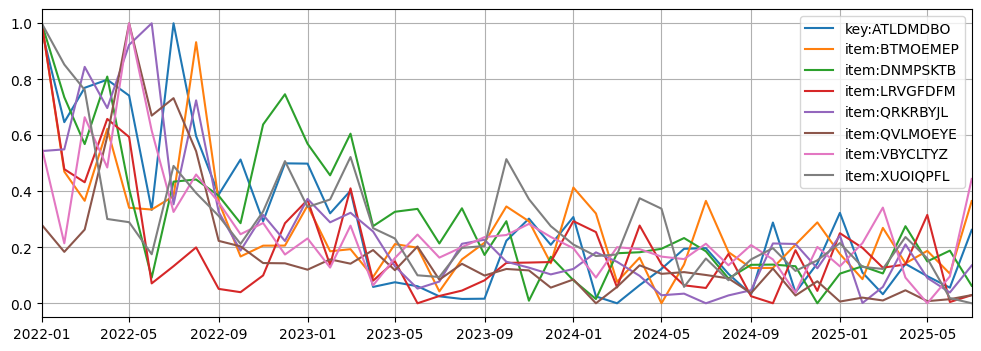

In [159]:
for i, (k, v) in enumerate(dict_hight_corr.items()):
  if k != 'ATLDMDBO': continue
  print(f'index = {i+1}, item, item name: {k}:{v}')

  fig = plt.figure(figsize=(12,4))

  ax = plt.gca()
  ax.plot((pivot.loc[k] - pivot.loc[k].min()) / (pivot.loc[k].max() - pivot.loc[k].min()), label = f'key:{k}')

  for j, item in enumerate(v):
    ax.plot((pivot.loc[item] - pivot.loc[item].min()) / (pivot.loc[item].max() - pivot.loc[item].min()), label = f'item:{item}')

  ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
  ax.legend()
  ax.grid()
  break

In [160]:
dict_hight_corr.items()

dict_items([('ATLDMDBO', ['BTMOEMEP', 'DNMPSKTB', 'LRVGFDFM', 'QRKRBYJL', 'QVLMOEYE', 'VBYCLTYZ', 'XUOIQPFL']), ('BSRMSVTC', ['SUOYXCHP']), ('BTMOEMEP', ['ATLDMDBO', 'LRVGFDFM']), ('DEWLVASR', ['ZKENOUDA']), ('DNMPSKTB', ['ATLDMDBO', 'LRVGFDFM', 'XUOIQPFL']), ('GYHKIVQT', ['QVLMOEYE']), ('IGDVVKUD', ['UGEQLMXM']), ('JPBRUTWP', ['QRKRBYJL', 'SDWAYPIK', 'VBYCLTYZ']), ('KEUWZRKO', ['SAHWCZNH']), ('LRVGFDFM', ['ATLDMDBO', 'BTMOEMEP', 'DNMPSKTB', 'XUOIQPFL']), ('LUENUFGA', ['XIFHSOWQ']), ('QRKRBYJL', ['ATLDMDBO', 'JPBRUTWP', 'QVLMOEYE', 'SDWAYPIK', 'VBYCLTYZ']), ('QVLMOEYE', ['ATLDMDBO', 'GYHKIVQT', 'QRKRBYJL', 'SDWAYPIK', 'VBYCLTYZ']), ('ROACSLMG', ['VBYCLTYZ']), ('SAHWCZNH', ['KEUWZRKO', 'WPQXWHYO']), ('SDWAYPIK', ['JPBRUTWP', 'QRKRBYJL', 'QVLMOEYE']), ('SUOYXCHP', ['BSRMSVTC']), ('UGEQLMXM', ['IGDVVKUD']), ('VBYCLTYZ', ['ATLDMDBO', 'JPBRUTWP', 'QRKRBYJL', 'QVLMOEYE', 'ROACSLMG']), ('WPQXWHYO', ['SAHWCZNH']), ('XIFHSOWQ', ['LUENUFGA']), ('XUOIQPFL', ['ATLDMDBO', 'DNMPSKTB', 'LRVGFDFM']), 

index=1, item, item name: ATLDMDBO:['BTMOEMEP', 'DNMPSKTB', 'LRVGFDFM', 'QRKRBYJL', 'QVLMOEYE', 'VBYCLTYZ', 'XUOIQPFL']
index=2, item, item name: BSRMSVTC:['SUOYXCHP']
index=3, item, item name: BTMOEMEP:['ATLDMDBO', 'LRVGFDFM']
index=4, item, item name: DEWLVASR:['ZKENOUDA']
index=5, item, item name: DNMPSKTB:['ATLDMDBO', 'LRVGFDFM', 'XUOIQPFL']
index=6, item, item name: GYHKIVQT:['QVLMOEYE']
index=7, item, item name: IGDVVKUD:['UGEQLMXM']
index=8, item, item name: JPBRUTWP:['QRKRBYJL', 'SDWAYPIK', 'VBYCLTYZ']
index=9, item, item name: KEUWZRKO:['SAHWCZNH']
index=10, item, item name: LRVGFDFM:['ATLDMDBO', 'BTMOEMEP', 'DNMPSKTB', 'XUOIQPFL']
index=11, item, item name: LUENUFGA:['XIFHSOWQ']
index=12, item, item name: QRKRBYJL:['ATLDMDBO', 'JPBRUTWP', 'QVLMOEYE', 'SDWAYPIK', 'VBYCLTYZ']
index=13, item, item name: QVLMOEYE:['ATLDMDBO', 'GYHKIVQT', 'QRKRBYJL', 'SDWAYPIK', 'VBYCLTYZ']
index=14, item, item name: ROACSLMG:['VBYCLTYZ']
index=15, item, item name: SAHWCZNH:['KEUWZRKO', 'WPQXWHYO'

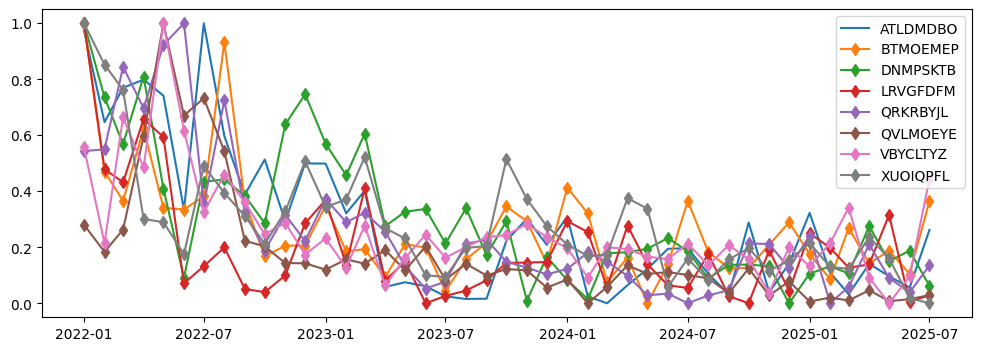

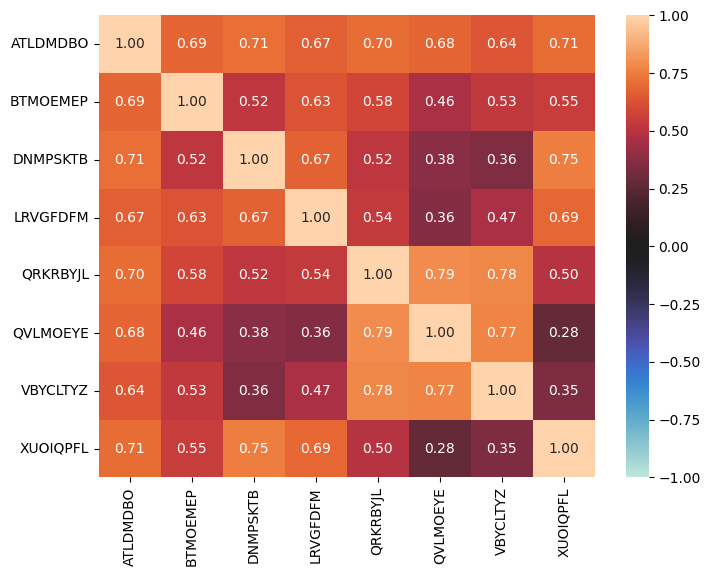

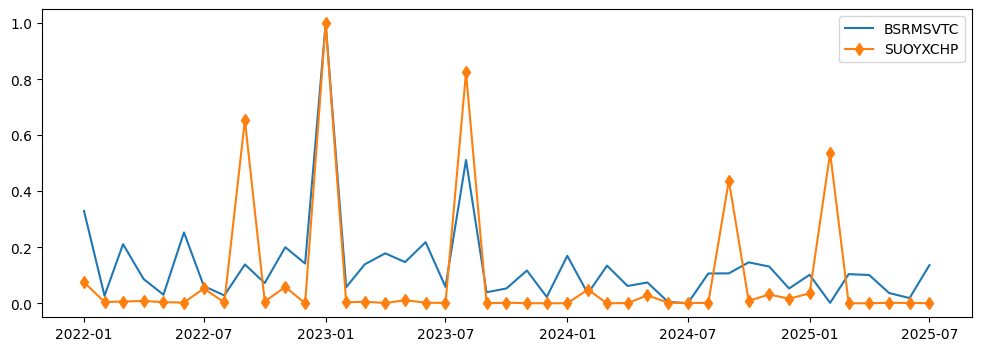

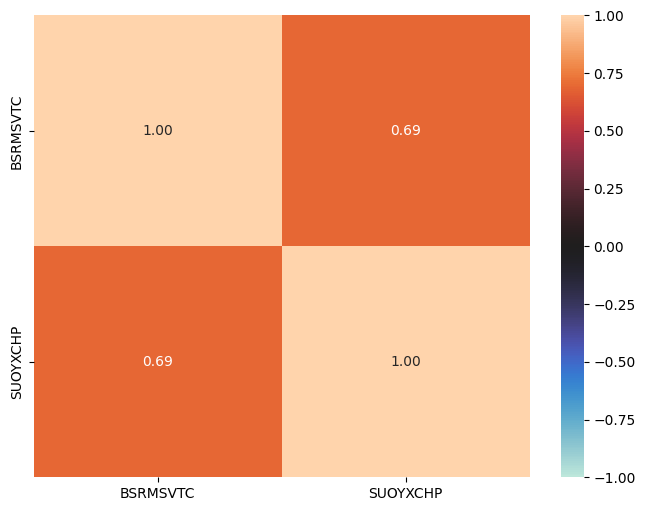

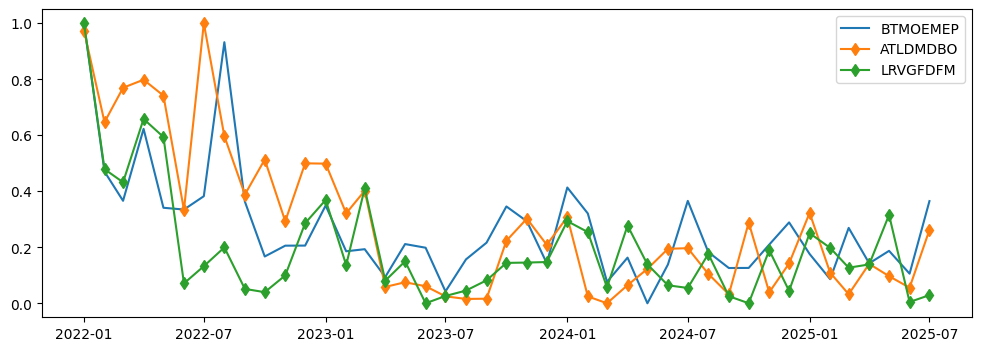

...

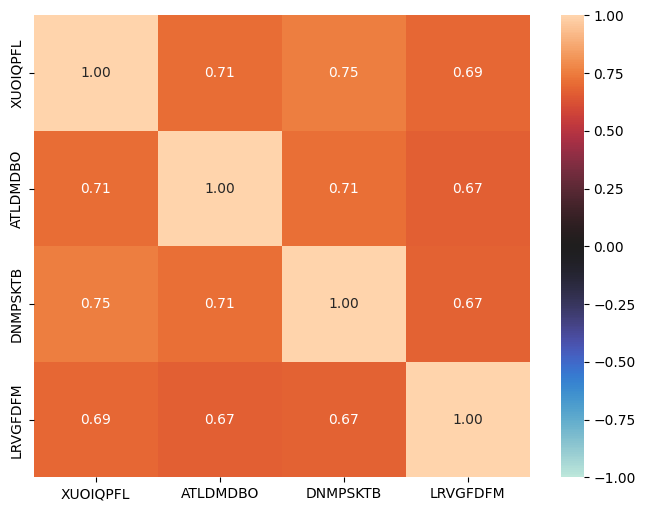

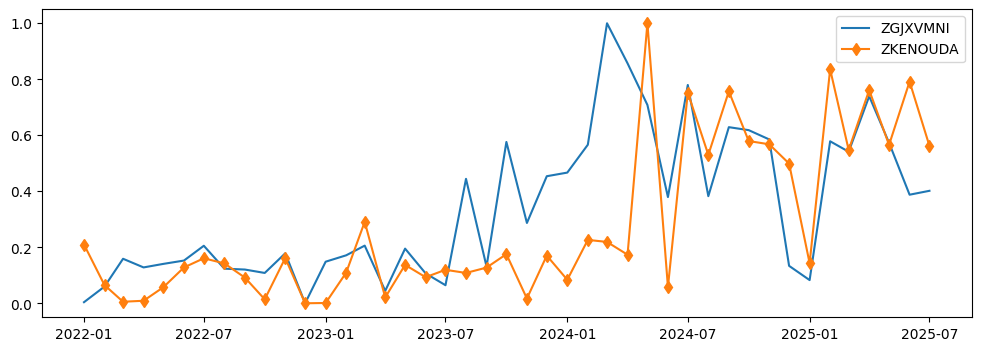

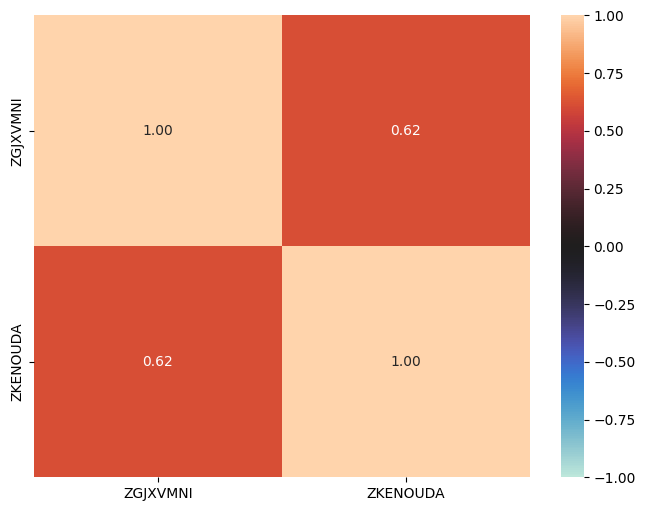

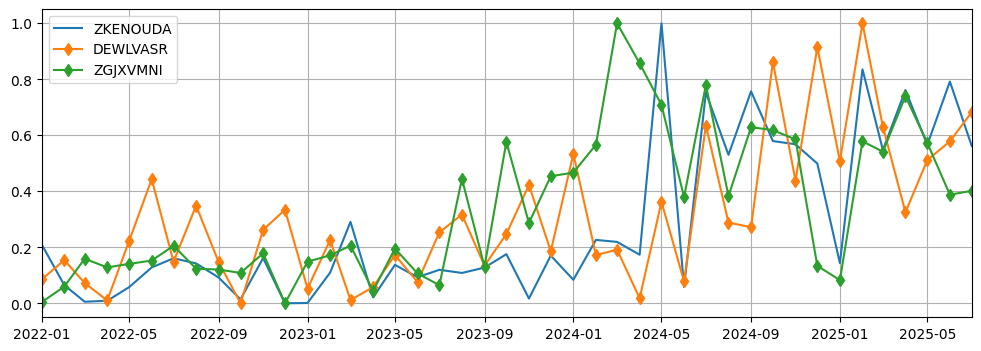

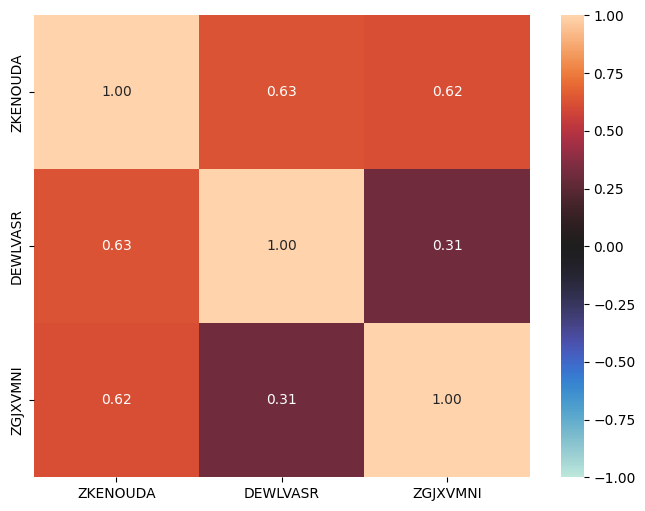

In [161]:
mod_dict_hight_cor = {}

for i, (k,v) in enumerate(dict_hight_corr.items()):
  print(f'index={i+1}, item, item name: {k}:{v}')

  fig = plt.figure(figsize=(12,4))
  df_hm_plot = pivot.loc[k].to_frame(name=k)
  ax = plt.gca()
  key_name1 = f'{k}'

  lbl_hmap = []
  lbl_hmap.append(key_name1)

  ax.plot((pivot.loc[k] - pivot.loc[k].min()) / (pivot.loc[k].max()- pivot.loc[k].min()), label=key_name1)

  df_hm_plot = pd.concat([df_hm_plot, pivot.loc[k]], axis=0)

  for j, item in enumerate(v):
    key_name2 = f'{item}'
    lbl_hmap.append(key_name2)

    ax.plot((pivot.loc[item]- pivot.loc[item].min())/(pivot.loc[item].max()- pivot.loc[item].min()), label=key_name2, marker='d')

    df_hm_plot[f'{item}'] = pivot.loc[item]

  fig_sns = plt.figure(figsize=(8,6))
  corr_mat = df_hm_plot.corr()
  ax.legend()

  sns.heatmap(corr_mat, annot=True, fmt='.2f', xticklabels=lbl_hmap, yticklabels=lbl_hmap, vmin=-1, vmax=1, center=0)

  tmp_dict = {}
  for m, item in enumerate(dict_hight_corr[k]):
    tmp_dict[item] = round(float(corr_mat.iloc[0, m+1]),2)

  mod_dict_hight_cor[k] = tmp_dict

ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
ax.grid()
plt.show()

#ATLDMDBO를 기준으로 높은 상관을 보인 품목들은 특정 시점(2022 초반, 2023 중반, 2025 초반 등)에서 유사한 상승·하락 패턴을 보였으며, 이는 단순 우연적 상관이 아닌 구조적 동행 가능성을 시사한다.

top2_seq_cat=seq_cnt_low, 9개 아이템, ['ANWUJOKX' 'GIKPEWTY' 'GMBFCMIU' 'KFQSHBNH' 'PLMZALFA' 'QSDCUCLB'
 'RJCAXSGH' 'RUVXNNVA' 'TANNMIMB']
index = 3, 1th item, item name: ANWUJOKX
index = 29, 2th item, item name: GIKPEWTY
index = 31, 3th item, item name: GMBFCMIU
index = 42, 4th item, item name: KFQSHBNH
index = 58, 5th item, item name: PLMZALFA
index = 63, 6th item, item name: QSDCUCLB
index = 67, 7th item, item name: RJCAXSGH
index = 70, 8th item, item name: RUVXNNVA
index = 77, 9th item, item name: TANNMIMB


<Axes: xlabel='item_id', ylabel='item_id'>

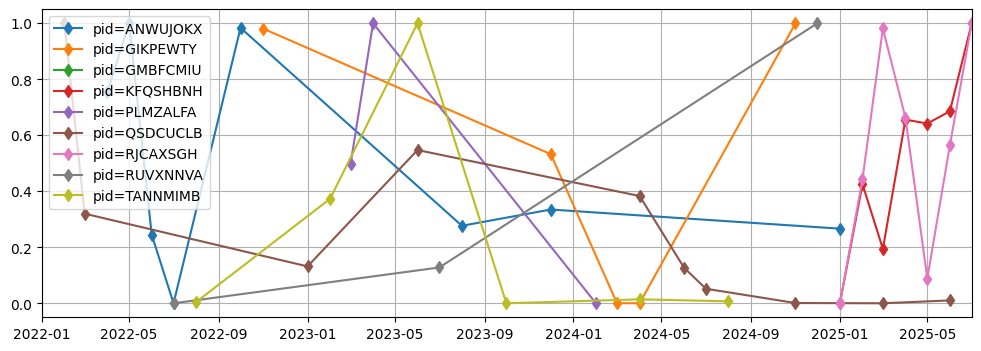

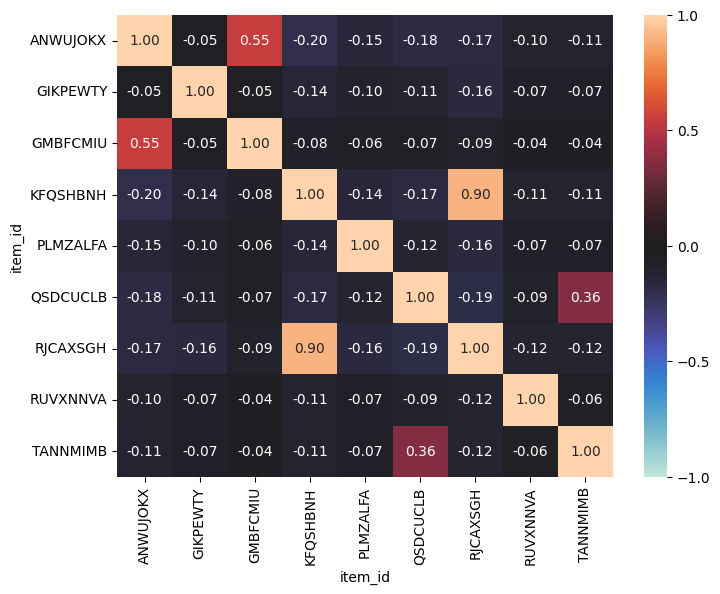

In [162]:
# sel_topN_seq_cat = 2 경우

sel_topN_seq_cat = 2
print(f'top{sel_topN_seq_cat}_seq_cat={topN_seq_cat[sel_topN_seq_cat-1]}, {len(dct_seq_cat[topN_seq_cat[sel_topN_seq_cat-1]])}개 아이템, {dct_seq_cat[topN_seq_cat[sel_topN_seq_cat-1]]}')
# top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

df_hm_plot = pd.DataFrame()
j= 0
fig = plt.figure(figsize=(12,4))
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_seq_cat[topN_seq_cat[sel_topN_seq_cat-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        df_hm_plot = pd.concat([df_hm_plot, group[1]], axis=0)

        ax = plt.gca()
        ax.plot(group[1]["ym"], (group[1]["value"]- group[1]["value"].min())/(group[1]["value"].max()- group[1]["value"].min()), label=f'pid={group[0]}', marker='d')

        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()

fig_sns = plt.figure(figsize=(8,6))
corr_mat= pd.pivot_table(df_hm_plot, index='ym', columns='item_id', values='value', fill_value=0).corr()
sns.heatmap(corr_mat, annot=True, fmt=".2f",vmin=-1, vmax=1, cbar_kws={'ticks': [-1, -0.5, 0, 0.5, 1]}, center=0 )

In [163]:
high_corr = []
for i, row in enumerate(corr_mat[(corr_mat.abs() > 0.4) & corr_mat[(corr_mat.abs() < 0.99)]].iterrows()):
    if row[1].any():
        print(( row[1][row[1].notna()].name, row[1][row[1].notna()].index.to_list()))
        high_corr.append((row[1][row[1].notna()].name, row[1][row[1].notna()].index.to_list()))

('ANWUJOKX', ['GMBFCMIU'])
('GMBFCMIU', ['ANWUJOKX'])
('KFQSHBNH', ['RJCAXSGH'])
('RJCAXSGH', ['KFQSHBNH'])


In [164]:
dict_hight_corr = dict(high_corr)
dict_hight_corr

{'ANWUJOKX': ['GMBFCMIU'],
 'GMBFCMIU': ['ANWUJOKX'],
 'KFQSHBNH': ['RJCAXSGH'],
 'RJCAXSGH': ['KFQSHBNH']}

index = 1, item, item name: ANWUJOKX : ['GMBFCMIU']
index = 2, item, item name: GMBFCMIU : ['ANWUJOKX']
index = 3, item, item name: KFQSHBNH : ['RJCAXSGH']
index = 4, item, item name: RJCAXSGH : ['KFQSHBNH']


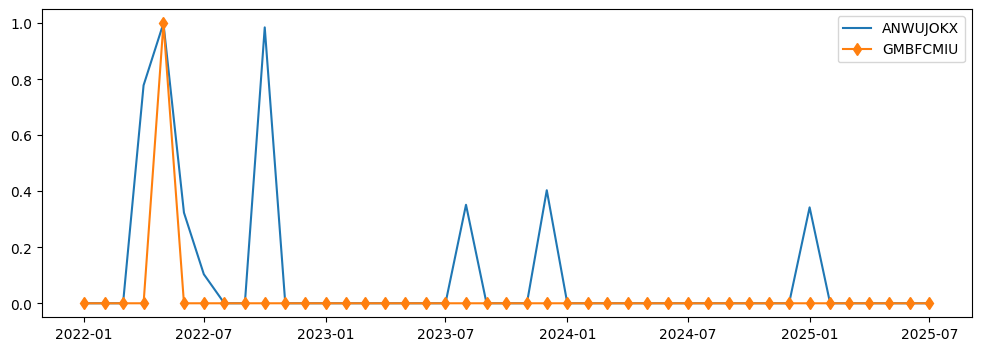

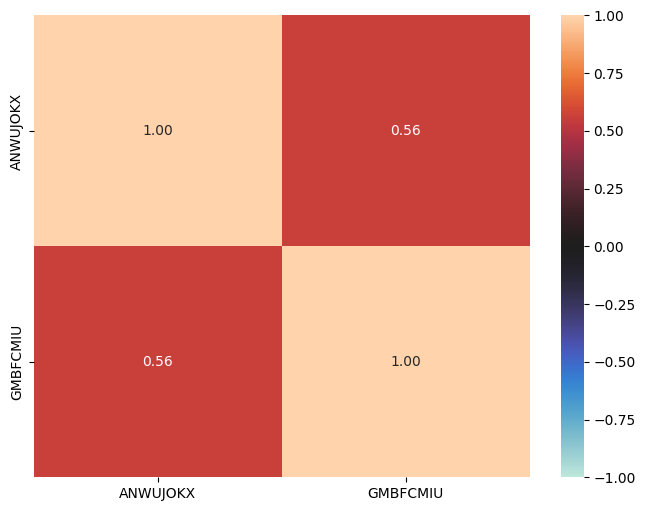

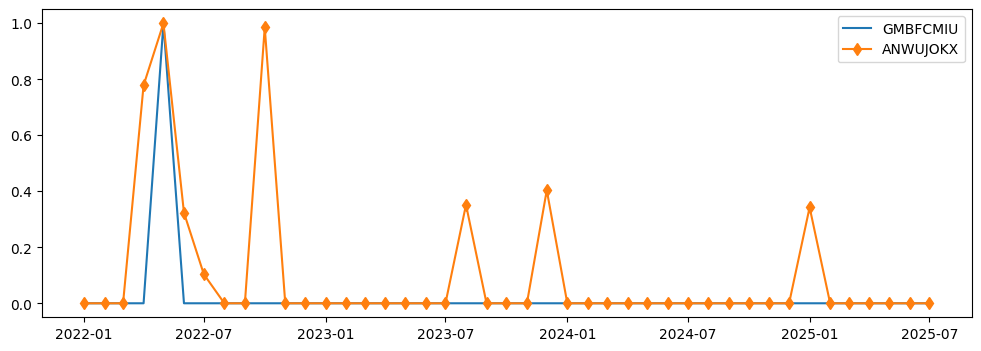

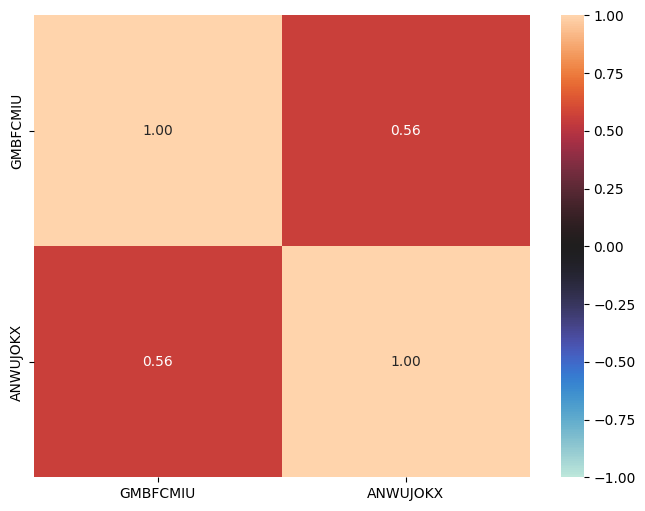

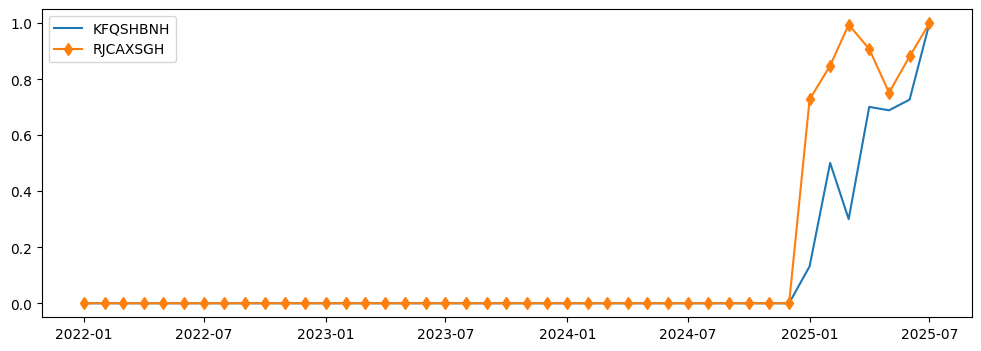

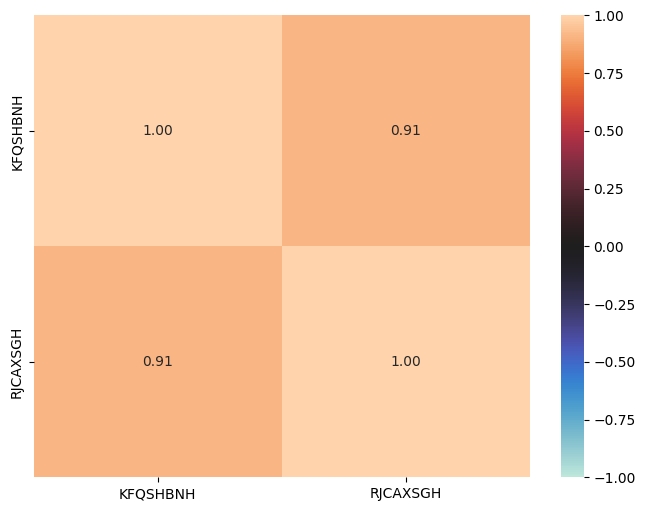

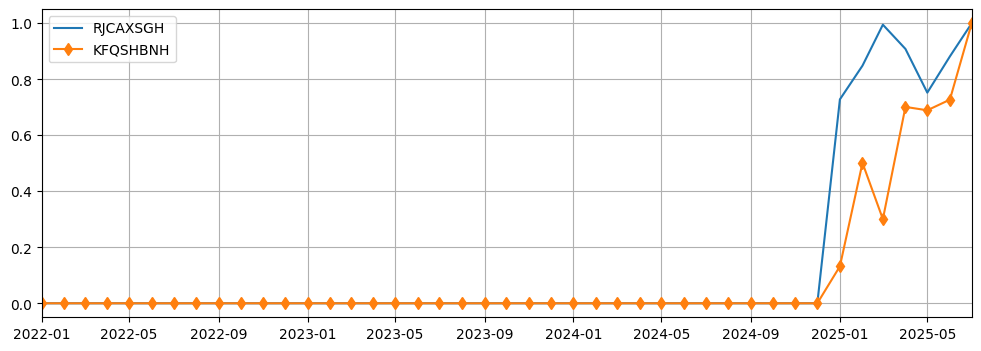

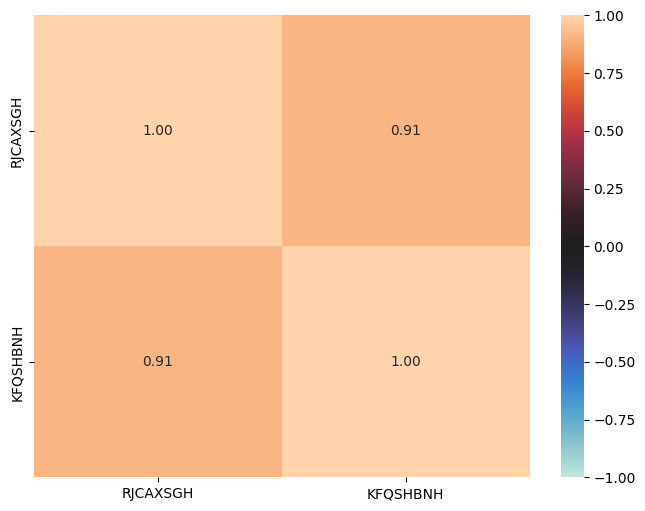

In [165]:
mod_dict_hight_cor = {}

for i, (k, v) in enumerate(dict_hight_corr.items()):
    print(f'index = {i+1}, item, item name: {k} : {v}')

    fig = plt.figure(figsize=(12,4))
    df_hm_plot = pivot.loc[k].to_frame(name=k)
    ax = plt.gca()
    key_name1 = f'{k}'

    lbl_hmap = []
    lbl_hmap.append(key_name1)

    ax.plot((pivot.loc[k] - pivot.loc[k].min()) / (pivot.loc[k].max()- pivot.loc[k].min()), label=key_name1)

    df_hm_plot = pd.concat([df_hm_plot, pivot.loc[k]], axis=0)

    for j, item in enumerate(v):
        key_name2 = f'{item}'
        lbl_hmap.append(key_name2)

        ax.plot((pivot.loc[item]- pivot.loc[item].min())/(pivot.loc[item].max()- pivot.loc[item].min()), label=key_name2, marker='d')

        df_hm_plot[f'{item}'] = pivot.loc[item]


    fig_sns = plt.figure(figsize=(8,6))

    corr_mat= df_hm_plot.corr()
    ax.legend()

    sns.heatmap(corr_mat, annot=True, fmt=".2f", xticklabels=lbl_hmap, yticklabels= lbl_hmap, vmin=-1, vmax=1, center=0)

    tmp_dict = {}
    for m, item in enumerate(dict_hight_corr[k]): # [ v1, v2]
        tmp_dict[item] = round(float(corr_mat.iloc[0, m+1]), 2)

    mod_dict_hight_cor[k] = tmp_dict

ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
ax.grid()
plt.show()

top3_seq_cat=seq_cnt_mid, 10개 아이템, ['AANGBULD' 'BLANHGYY' 'DJBLNPNC' 'FWUCPMMW' 'MIRCVAMV' 'NAQIHUKZ'
 'OGAFEHLU' 'PYZMVUWD' 'TGOELCAG' 'XIIEJNEE']
index = 1, 1th item, item name: AANGBULD
index = 9, 2th item, item name: BLANHGYY
index = 17, 3th item, item name: DJBLNPNC
index = 28, 4th item, item name: FWUCPMMW
index = 51, 5th item, item name: MIRCVAMV
index = 52, 6th item, item name: NAQIHUKZ
index = 54, 7th item, item name: OGAFEHLU
index = 59, 8th item, item name: PYZMVUWD
index = 78, 9th item, item name: TGOELCAG
index = 92, 10th item, item name: XIIEJNEE


<Axes: xlabel='item_id', ylabel='item_id'>

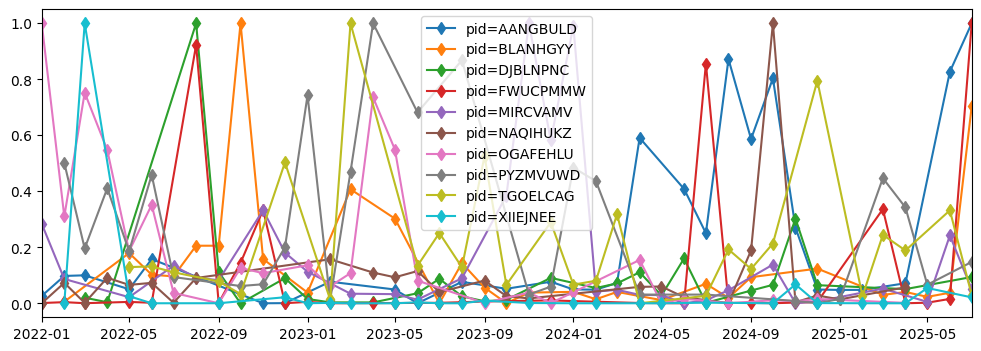

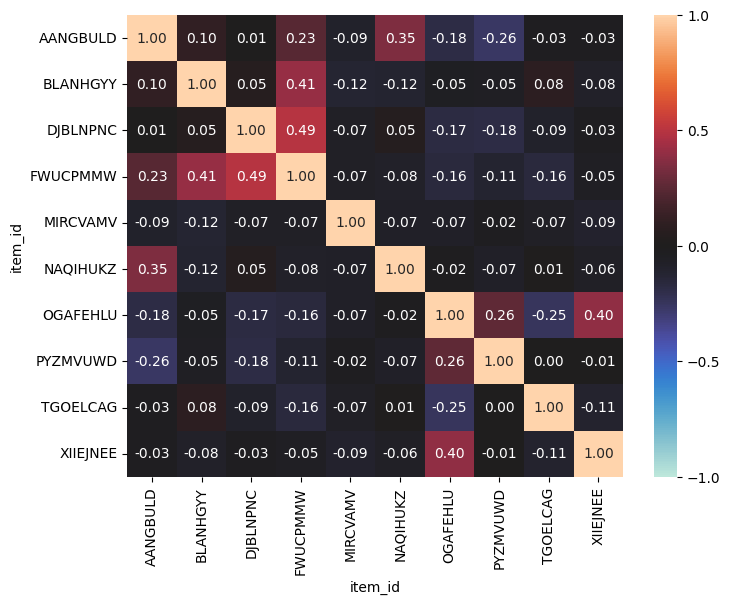

In [166]:
###
### sel_topN_seq_cat = 3 경우
###

sel_topN_seq_cat = 3
print(f'top{sel_topN_seq_cat}_seq_cat={topN_seq_cat[sel_topN_seq_cat-1]}, {len(dct_seq_cat[topN_seq_cat[sel_topN_seq_cat-1]])}개 아이템, {dct_seq_cat[topN_seq_cat[sel_topN_seq_cat-1]]}') # top1_hs4 : ['BSRMSVTC' 'DJBLNPNC' 'RCBZUSIM' 'SUOYXCHP' 'WQMVCOEM' 'ZKENOUDA']

df_hm_plot = pd.DataFrame()
j= 0
fig = plt.figure(figsize=(12,4))
for i, group in enumerate(monthly.groupby("item_id")[['item_id','ym', 'value']]):
    if group[0] in dct_seq_cat[topN_seq_cat[sel_topN_seq_cat-1]]:
        j += 1
        print(f'index = {i+1}, {j}th item, item name: {group[0]}')

        df_hm_plot = pd.concat([df_hm_plot, group[1]], axis=0)

        ax = plt.gca()
        ax.plot(group[1]["ym"], (group[1]["value"]- group[1]["value"].min())/(group[1]["value"].max()- group[1]["value"].min()), label=f'pid={group[0]}', marker='d')

        ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
        ax.legend()
        ax.grid()

fig_sns = plt.figure(figsize=(8,6))
corr_mat= pd.pivot_table(df_hm_plot, index='ym', columns='item_id', values='value', fill_value=0).corr()
sns.heatmap(corr_mat, annot=True, fmt=".2f",vmin=-1, vmax=1, cbar_kws={'ticks': [-1, -0.5, 0, 0.5, 1]}, center=0 )

In [167]:
high_corr = []
for i, row in enumerate(corr_mat[(corr_mat.abs() > 0.4) & corr_mat[(corr_mat.abs() < 0.99)]].iterrows()):
    if row[1].any():
        print(( row[1][row[1].notna()].name, row[1][row[1].notna()].index.to_list()))
        high_corr.append((row[1][row[1].notna()].name, row[1][row[1].notna()].index.to_list()))

('BLANHGYY', ['FWUCPMMW'])
('DJBLNPNC', ['FWUCPMMW'])
('FWUCPMMW', ['BLANHGYY', 'DJBLNPNC'])


In [168]:
dict_hight_corr = dict(high_corr)
dict_hight_corr

{'BLANHGYY': ['FWUCPMMW'],
 'DJBLNPNC': ['FWUCPMMW'],
 'FWUCPMMW': ['BLANHGYY', 'DJBLNPNC']}

index = 1, item, item name: BLANHGYY : ['FWUCPMMW']
index = 2, item, item name: DJBLNPNC : ['FWUCPMMW']
index = 3, item, item name: FWUCPMMW : ['BLANHGYY', 'DJBLNPNC']


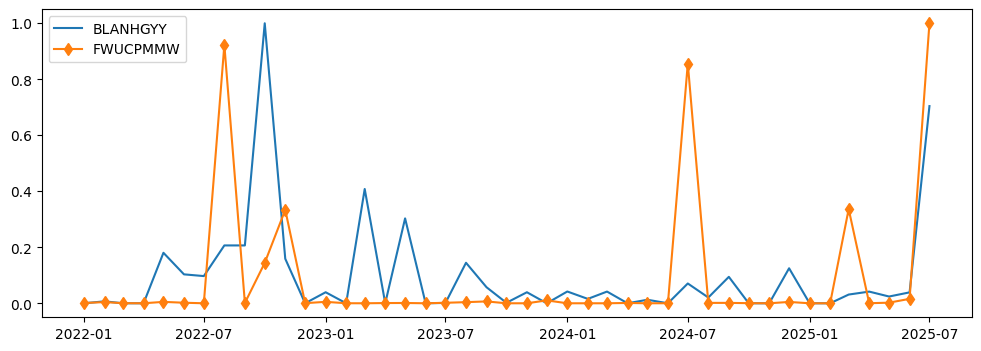

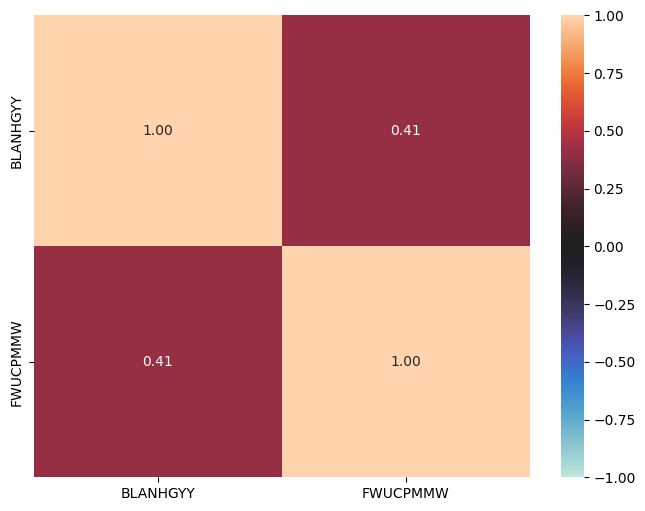

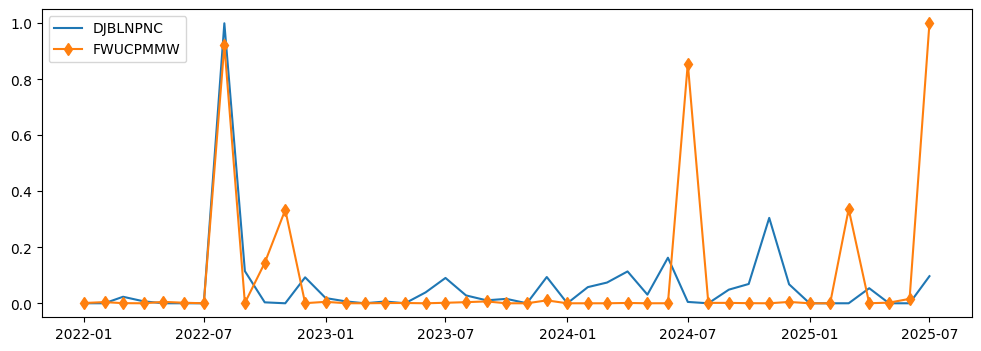

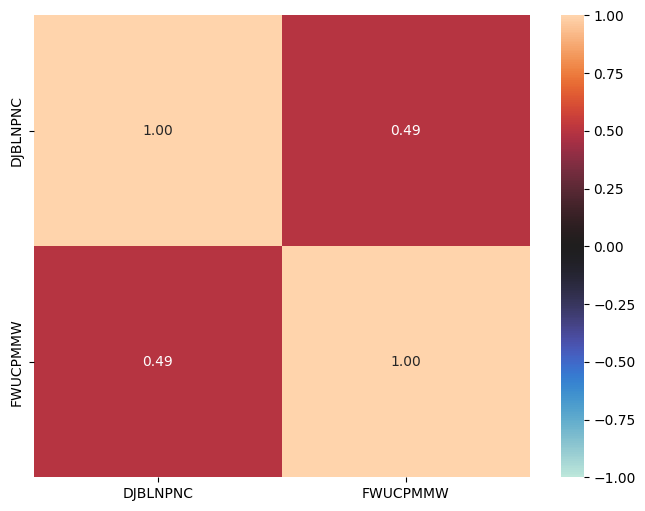

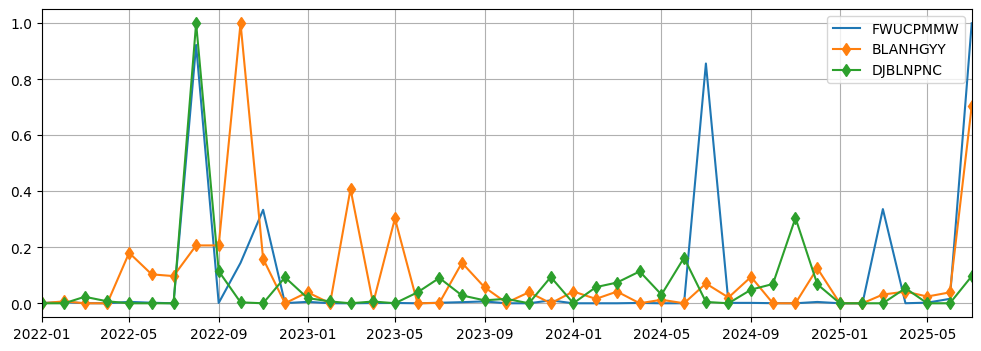

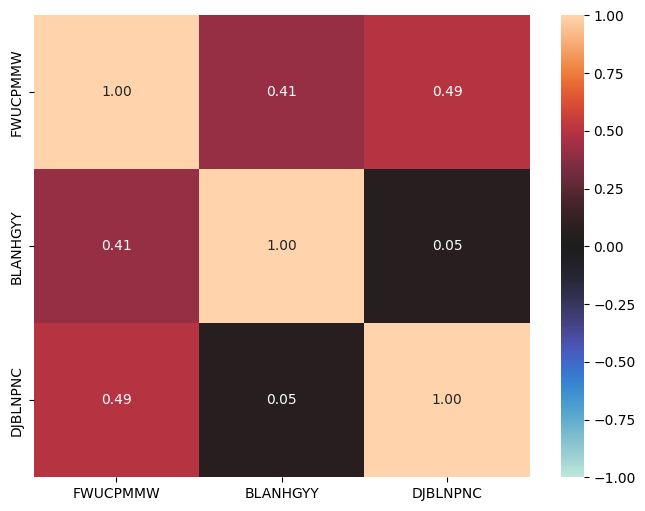

In [169]:
mod_dict_hight_cor = {}

for i, (k, v) in enumerate(dict_hight_corr.items()):
    print(f'index = {i+1}, item, item name: {k} : {v}')

    fig = plt.figure(figsize=(12,4))
    df_hm_plot = pivot.loc[k].to_frame(name=k)
    ax = plt.gca()
    key_name1 = f'{k}'

    lbl_hmap = []
    lbl_hmap.append(key_name1)

    ax.plot((pivot.loc[k] - pivot.loc[k].min()) / (pivot.loc[k].max()- pivot.loc[k].min()), label=key_name1)

    df_hm_plot = pd.concat([df_hm_plot, pivot.loc[k]], axis=0)

    for j, item in enumerate(v):
        key_name2 = f'{item}'
        lbl_hmap.append(key_name2)

        ax.plot((pivot.loc[item]- pivot.loc[item].min())/(pivot.loc[item].max()- pivot.loc[item].min()), label=key_name2, marker='d')

        df_hm_plot[f'{item}'] = pivot.loc[item]


    fig_sns = plt.figure(figsize=(8,6))

    corr_mat= df_hm_plot.corr()
    ax.legend()

    sns.heatmap(corr_mat, annot=True, fmt=".2f", xticklabels=lbl_hmap, yticklabels= lbl_hmap, vmin=-1, vmax=1, center=0)

    tmp_dict = {}
    for m, item in enumerate(dict_hight_corr[k]): # [ v1, v2]
        tmp_dict[item] = round(float(corr_mat.iloc[0, m+1]), 2)

    mod_dict_hight_cor[k] = tmp_dict

ax.set_xlim([monthly['ym'].min(), monthly['ym'].max()])
ax.grid()
plt.show()

공행성쌍 데이터

In [172]:
def safe_corr(x, y):
    if np.std(x) == 0 or np.std(y) == 0:
        return 0.0
    return float(np.corrcoef(x, y)[0, 1])

def find_comovement_pairs(pivot, max_lag=6, min_nonzero=12, corr_threshold=0.4):
    items = pivot.index.to_list()
    months = pivot.columns.to_list()
    n_months = len(months)

    results = []

    for i, leader in tqdm(enumerate(items)):
        x = pivot.loc[leader].values.astype(float)
        if np.count_nonzero(x) < min_nonzero:
            continue

        for follower in items:
            if follower == leader:
                continue

            y = pivot.loc[follower].values.astype(float)
            if np.count_nonzero(y) < min_nonzero:
                continue

            best_lag = None
            best_corr = 0.0

            # lag = 1 ~ max_lag 탐색
            for lag in range(1, max_lag + 1):
                if n_months <= lag:
                    continue
                corr = safe_corr(x[:-lag], y[lag:])
                if abs(corr) > abs(best_corr):
                    best_corr = corr
                    best_lag = lag

            # 임계값 이상이면 공행성쌍으로 채택
            if best_lag is not None and abs(best_corr) >= corr_threshold:
                results.append({
                    "leading_item_id": leader,
                    "following_item_id": follower,
                    "best_lag": best_lag,
                    "max_corr": best_corr,
                })

    pairs = pd.DataFrame(results)
    return pairs

pairs = find_comovement_pairs(pivot)
print("탐색된 공행성쌍 수:", len(pairs))
pairs.head()

100it [00:13,  7.29it/s]

탐색된 공행성쌍 수: 1425


,leading_item_id,following_item_id,best_lag,max_corr
0,AANGBULD,APQGTRMF,5,-0.443984
1,AANGBULD,DEWLVASR,6,0.640221
2,AANGBULD,DNMPSKTB,4,-0.410635
3,AANGBULD,EVBVXETX,6,0.436623
4,AANGBULD,FTSVTTSR,3,0.531400


In [173]:
pairs_mod = pairs.copy()
pairs_mod['max_corr_abs'] = pairs_mod['max_corr'].apply(np.abs)
pairs_mod.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1425 entries, 0 to 1424
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   leading_item_id    1425 non-null   object 
 1   following_item_id  1425 non-null   object 
 2   best_lag           1425 non-null   int64  
 3   max_corr           1425 non-null   float64
 4   max_corr_abs       1425 non-null   float64
dtypes: float64(2), int64(1), object(2)
memory usage: 55.8+ KB


In [174]:
pairs_mod.describe()

,best_lag,max_corr,max_corr_abs
count,1425.000000,1425.000000,1425.000000
mean,3.583860,0.278850,0.500241
std,1.721116,0.425079,0.089929
min,1.000000,-0.708337,0.400091
25%,2.000000,0.401780,0.431703
50%,4.000000,0.449424,0.475313
75%,5.000000,0.527682,0.546019
max,6.000000,0.928613,0.928613


In [176]:
df_pairs_mod = pairs_mod.groupby('leading_item_id')['following_item_id'] \
    .aggregate(["size"]).sort_values(by='size', ascending=False) # or 'count'
df_pairs_mod

###
### ==> 따라서 100개 아이템중 9개는 공행성쌍이 탐지 되지않았다. ==> 공행성쌍이 탐지 vs. 공행성쌍이 탐지 실패 아이템으로 cat. 가능
###

dct_pair_detection = {'comv_yes':df_pairs_mod.index.to_list() ,
                      'comv_no': set(data['item_id']).difference(set(df_pairs_mod.index.to_list()))}
print("공행성이 탐지되지 않은 상품수: ", len(dct_pair_detection['comv_no']))
print("공행성이 탐지되지 않은 상품id: ", dct_pair_detection['comv_no'])
print("공행성 탐지된 상품수: ", len(dct_pair_detection['comv_yes']))
print("공행성이 탐지된 상품id: ", dct_pair_detection['comv_yes'])

공행성이 탐지되지 않은 상품수:  9
공행성이 탐지되지 않은 상품id:  {'GIKPEWTY', 'KFQSHBNH', 'GMBFCMIU', 'RUVXNNVA', 'QSDCUCLB', 'RJCAXSGH', 'ANWUJOKX', 'PLMZALFA', 'TANNMIMB'}
공행성 탐지된 상품수:  91
공행성이 탐지된 상품id:  ['SDWAYPIK', 'DNMPSKTB', 'QRKRBYJL', 'GYHKIVQT', 'OGAFEHLU', 'UGEQLMXM', 'XUOIQPFL', 'WBLJNPZQ', 'QVLMOEYE', 'BTMOEMEP', 'JPBRUTWP', 'APQGTRMF', 'ZGJXVMNI', 'VBYCLTYZ', 'ATLDMDBO', 'ZKENOUDA', 'LRVGFDFM', 'HXYSSRXE', 'BLANHGYY', 'OKMBFVKS', 'OXKURKXR', 'AXULOHBQ', 'XIIEJNEE', 'UXSPKBJR', 'IGDVVKUD', 'EVBVXETX', 'BSRMSVTC', 'FQCLOEXA', 'DEWLVASR', 'NZKBIBNU', 'ELQGMQWE', 'RJGPVEXX', 'DBWLZWNK', 'FDXPMYGF', 'RCBZUSIM', 'LSOIUSXD', 'BEZYMBBT', 'LLHREMKS', 'AANGBULD', 'UIFPPCLR', 'PYZMVUWD', 'SAHWCZNH', 'ROACSLMG', 'LPHPPJUG', 'VUAFAIYJ', 'CCLHWFWF', 'BJALXPFS', 'RAWUKQMJ', 'JBVHSUWY', 'LUENUFGA', 'KJNSOAHR', 'VMAQSTJE', 'DJBLNPNC', 'FWUCPMMW', 'XIFHSOWQ', 'LTOYKIML', 'WPQXWHYO', 'FRHNWLNI', 'FTSVTTSR', 'HCDTGMST', 'KEUWZRKO', 'JSLXRQOK', 'KAGJCHMR', 'AHMDUILJ', 'BUZIIBYG', 'NAQIHUKZ', 'ZCELVYQU', 'MIRCVAMV', 

In [177]:
df_pairs_mod.describe()

,size
count,91.000000
mean,15.659341
std,9.227037
min,2.000000
25%,8.000000
50%,13.000000
75%,23.000000
max,37.000000


count : [12. 12. 18. 10.  9.  7.  8.  6.  6.  3.]
bins : [ 2.   5.5  9.  12.5 16.  19.5 23.  26.5 30.  33.5 37. ]
container : <BarContainer object of 10 artists>
2.0 ~ 5.5 : 12개
5.5 ~ 9.0 : 12개
9.0 ~ 12.5 : 18개
12.5 ~ 16.0 : 10개
16.0 ~ 19.5 : 9개
19.5 ~ 23.0 : 7개
23.0 ~ 26.5 : 8개
26.5 ~ 30.0 : 6개
30.0 ~ 33.5 : 6개
33.5 ~ 37.0 : 3개


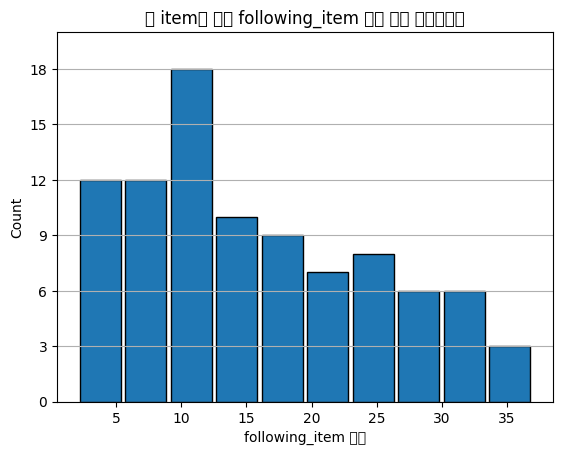

In [178]:
count, bins, container = plt.hist(df_pairs_mod['size'], bins=10, edgecolor='k', rwidth=.9) #
print('count :', count)
print('bins :', bins)
print('container :', container)


for i in range(len(bins)-1):
    print(f'{bins[i]} ~ {bins[i+1]} : {int(count[i])}개')

plt.xlabel('following_item 갯수')
plt.ylabel('Count')
plt.ylim([0, 20])
plt.yticks([0, 3, 6, 9, 12, 15, 18])
plt.grid(axis='y')

plt.title("한 item에 대한 following_item 갯수 분포 히스토그램")
plt.show()

count : [214. 248. 229. 232. 230. 272.]
bins : [1.         1.83333333 2.66666667 3.5        4.33333333 5.16666667
 6.        ]
container : <BarContainer object of 6 artists>
1.0 ~ 1.8333333333333335 : 214개
1.8333333333333335 ~ 2.666666666666667 : 248개
2.666666666666667 ~ 3.5 : 229개
3.5 ~ 4.333333333333334 : 232개
4.333333333333334 ~ 5.166666666666667 : 230개
5.166666666666667 ~ 6.0 : 272개


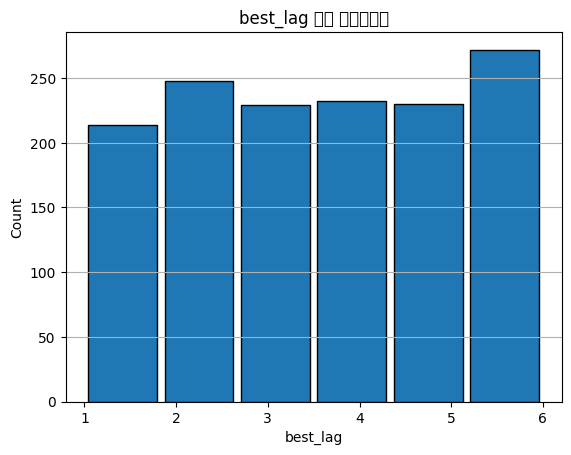

In [179]:
count, bins, container = plt.hist(pairs_mod['best_lag'], bins=6, edgecolor='k', rwidth=.9)
print('count :', count)
print('bins :', bins)
print('container :', container)


for i in range(len(bins)-1):
    print(f'{bins[i]} ~ {bins[i+1]} : {int(count[i])}개')

plt.xlabel('best_lag')
plt.ylabel('Count')
plt.grid(axis='y')

plt.title("best_lag 분포 히스토그램")
plt.show()

count : [  6.  41. 116. 169.   0.   0.   0.   0.   0.   0.   0.   0.   0. 299.
 412. 204. 107.  52.  13.   6.]
bins : [-0.70833733 -0.62648981 -0.54464228 -0.46279476 -0.38094723 -0.29909971
 -0.21725218 -0.13540466 -0.05355713  0.02829039  0.11013792  0.19198544
  0.27383296  0.35568049  0.43752801  0.51937554  0.60122306  0.68307059
  0.76491811  0.84676564  0.92861316]
container : <BarContainer object of 20 artists>


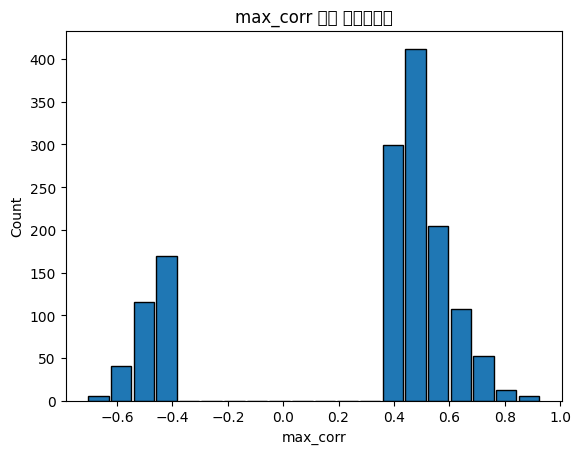

In [180]:
count, bins, container = plt.hist(pairs_mod['max_corr'], bins=20, edgecolor='k', rwidth=.9)
print('count :', count)
print('bins :', bins)
print('container :', container)


plt.xlabel('max_corr')
plt.ylabel('Count')
plt.title("max_corr 분포 히스토그램")
plt.show()